## LIBRARY

In [1]:
import warnings

# At the beginning of your script, add:
warnings.filterwarnings("ignore", message=".*TypedStorage is deprecated.*")

In [2]:
!pip uninstall -y torch torchvision torchaudio dgl

Found existing installation: torch 2.7.0
Uninstalling torch-2.7.0:
  Successfully uninstalled torch-2.7.0
Found existing installation: torchvision 0.15.1+cu118
Uninstalling torchvision-0.15.1+cu118:
  Successfully uninstalled torchvision-0.15.1+cu118
Found existing installation: torchaudio 2.0.1+cu118
Uninstalling torchaudio-2.0.1+cu118:
  Successfully uninstalled torchaudio-2.0.1+cu118
Found existing installation: dgl 1.0.2+cu118
Uninstalling dgl-1.0.2+cu118:
  Successfully uninstalled dgl-1.0.2+cu118


In [3]:
!pip install \
    torch==2.0.0 \
    torchvision==0.15.1 \
    torchaudio==2.0.1 \
    --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
  Using cached https://download.pytorch.org/whl/cu118/torch-2.0.0%2Bcu118-cp310-cp310-win_amd64.whl (2611.3 MB)
  Using cached https://download.pytorch.org/whl/cu118/torchvision-0.15.1%2Bcu118-cp310-cp310-win_amd64.whl (4.9 MB)
  Using cached https://download.pytorch.org/whl/cu118/torchaudio-2.0.1%2Bcu118-cp310-cp310-win_amd64.whl (2.5 MB)

   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   ---------------------------------------- 0/3 [torch]
   -----------------------------------

In [4]:
!pip install torchdata==0.6.0


[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
!pip install pyvista==0.39.0 networkx==3.4.2

  Using cached pyvista-0.39.0-py3-none-any.whl.metadata (14 kB)
Using cached pyvista-0.39.0-py3-none-any.whl (1.6 MB)
  Attempting uninstall: pyvista
    Found existing installation: pyvista 0.45.0
    Uninstalling pyvista-0.45.0:
      Successfully uninstalled pyvista-0.45.0



[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
!pip install \
    dgl==1.0.2+cu118 \
    -f https://data.dgl.ai/wheels/cu118/repo.html

Looking in links: https://data.dgl.ai/wheels/cu118/repo.html
  Using cached https://data.dgl.ai/wheels/cu118/dgl-1.0.2%2Bcu118-cp310-cp310-win_amd64.whl (75.2 MB)



[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
# Installation avec des versions spécifiques et compatibles
!pip install pyvista==0.39.0
!pip install networkx==3.4.2
import numpy as np
import torch
import pandas as pd
import pyvista as pv
import networkx as nx
import glob
import time
import sys
import dgl
import dgl.data
import os
import dgl.dataloading
import tqdm
import matplotlib.pyplot as plt


[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
import dgl, torch

print("PyTorch:", torch.__version__, "| CUDA toolkit:", torch.version.cuda)
print("torch.cuda.is_available():", torch.cuda.is_available())
if torch.cuda.is_available():
    print(" → GPU:", torch.cuda.get_device_name(0))

print("DGL:", dgl.__version__, "| backend:", dgl.backend.backend_name)


PyTorch: 2.0.0+cu118 | CUDA toolkit: 11.8
torch.cuda.is_available(): True
 → GPU: NVIDIA GeForce RTX 4060
DGL: 1.0.2+cu118 | backend: pytorch


In [10]:
print(device)

cuda


#### Loading data

In [10]:
!pip install fastparquet
df_log = pd.read_parquet('./Data/logs.parquet', engine='fastparquet')


[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [11]:
#We first create downsample the gamma rays to per feet.
df_log = pd.read_parquet('./Data/logs.parquet', engine='fastparquet')
#df_log = df_log.set_index('wellName')
df_log.loc[df_log['GR'] < -1, 'GR' ] = -1
df_loc = pd.read_parquet('./Data/loc.parquet', engine='fastparquet')
df_loc = df_loc.reset_index()
df_log = df_loc.merge(df_log, how = 'inner', left_on = 'wellName', right_on = 'wellName')
print(df_log.head())

      wellName   Latitude  Longitude  DEPTH        GR
0  512320698.0  48.673353   2.145178  421.0   96.9752
1  512320698.0  48.673353   2.145178  421.5  102.3324
2  512320698.0  48.673353   2.145178  422.0  104.6432
3  512320698.0  48.673353   2.145178  422.5   99.2187
4  512320698.0  48.673353   2.145178  423.0   92.0200


In [12]:
df_log.loc[df_log['GR'] ==-1]

,wellName,Latitude,Longitude,DEPTH,GR
12775,512320698.0,48.673353,2.145178,6808.5,-1.0
12776,512320698.0,48.673353,2.145178,6809.0,-1.0
12777,512320698.0,48.673353,2.145178,6809.5,-1.0
12778,512320698.0,48.673353,2.145178,6810.0,-1.0
12779,512320698.0,48.673353,2.145178,6810.5,-1.0
...,...,...,...,...,...
7590212,512333613.0,48.626213,2.155538,6841.5,-1.0
7590213,512333613.0,48.626213,2.155538,6842.0,-1.0
7590214,512333613.0,48.626213,2.155538,6842.5,-1.0
7590215,512333613.0,48.626213,2.155538,6843.0,-1.0


In [14]:
df_tops = pd.read_parquet('./Data/tops.parquet', engine='fastparquet')
cols = ['MARCEL','CONRAD', 'SYLVAIN']
df_tops = df_tops[cols]
df_tops.dropna(inplace = True)
df_tops.head()

,MARCEL,CONRAD,SYLVAIN
wellName,,,
512320698.0,6398.0,6661.0,6638.0
512320699.0,6407.0,6676.0,6656.0
512320928.0,6520.0,6793.0,6746.0
512320970.0,6544.0,6816.0,6770.0
512320971.0,6510.0,6789.0,6742.0


In [15]:
df_tops.describe()

,MARCEL,CONRAD,SYLVAIN
count,536.000000,536.000000,536.000000
mean,6399.598881,6673.501866,6645.972015
std,138.038101,143.139720,142.382889
min,5900.000000,6189.000000,6151.000000
25%,6304.000000,6569.750000,6544.000000
50%,6432.500000,6709.500000,6684.500000
75%,6496.250000,6781.250000,6750.500000
max,6838.000000,7033.000000,7010.000000


### Functions

In [16]:
#cleaned tabel per well
def Well_grlog_cleaning(well_name: str
                        , df_log : pd.DataFrame
                        , input_variable: list
                        ):

    """
    The function gives a cleaned dataframe for a particular well name given in the input.
    Function input:
    - well_name: Name of the well(must be a string) needs convertions if well_name is float or int
    - df_log: The well log dataframe
    - input_variable: A list of column label for input variables required for the deep learning model.

    Output: It is a pandas dataframe with same time stamp, no Nan and consisiting only the input feature bvariables for the deep learing model.
    """

    df_wgr = df_log.where(df_log['wellName'] == well_name ).dropna().copy(deep = True)
    #df_wgr = df_log[df_log.index == well_name].dropna()
    df_wgr['GR'].replace(-1, df_wgr['GR'].mean(), inplace = True)
    df_wgr['DEPTH'] = df_wgr['DEPTH'].astype('int')
    df_wgr = df_wgr.groupby('DEPTH').mean()
    df_wgr['Depth'] = df_wgr.index
    df_wgr = df_wgr[input_variable]

    return df_wgr

In [17]:
#creating a step function for the labels
def step_function(start_depth: int,
                  end_depth: int,
                  tops_depth: list):

    """
    Generates the step function values if start_time < times[0] < times[1] < ... < times[-1] < end_time.
    Function input:
    - start_depth: The starting time (int)
    - end_depth: The ending time (int)
    - tops_depth: A list of times to check (list)

    Output: A list of tuples representing the step function values, or an empty list if conditions are not met
    """

    if not tops_depth:
        return []  # If the array is empty, return an empty list

    # Check if times are in ascending order and within the range
    if not all(tops_depth[i] < tops_depth[i + 1] for i in range(len(tops_depth) - 1)):
        return []

    # Check the boundary conditions
    if not (start_depth < tops_depth[0] and tops_depth[-1] < end_depth):
        return []

    # Generate step function values with increments only at specified times
    step_values = []
    current_value = 1

    for depth in range(start_depth+1, end_depth + 1):
        if depth in tops_depth:
            current_value += 1
        step_values.append((depth, current_value))

    return step_values


In [18]:
def create_graph(df_well: pd.DataFrame,
                 step_values: list) :

    """
    Creates a graph from the step function values where each tuple is a node.
    Function input:
    - step_values: A list of tuples representing the step function values.

    Output: A DGLGraph where each tuple is a node, the time is a feature, and the value is the label.
    """

    num_nodes = len(step_values)

    # Return an empty graph if there are no nodes
    if num_nodes == 0:
        return dgl.graph(([], []))

    # Create edge list for a linear graph
    src = list(range(num_nodes - 1))
    dst = list(range(1, num_nodes))

    # Create a graph with the edge list
    g = dgl.graph((src, dst))

    # Add nodes with features and labels
    features = torch.tensor(df_well.values, dtype=torch.float32)
    position = torch.tensor(df_well.iloc[:, 1:4].values, dtype=torch.float32)
    labels = torch.tensor([t[1] for t in step_values], dtype=torch.int64)

    g.ndata['features'] = features  # Add gr, depth, lat, long as a feature
    g.ndata['pos'] = position
    g.ndata['label'] = labels  # Add as a label

    return g

### Preparing data for graph

In [19]:
well = 512320698.0
input_variable = ['GR', 'Depth','Latitude','Longitude']
df_wgr = Well_grlog_cleaning(well, df_log, input_variable)

#input features
#take the depths after 5500ft
start_depth = 6000
df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
df_wgr

,GR,Depth,Latitude,Longitude
DEPTH,,,,
6001,80.535050,6001,48.673353,2.145178
6002,88.651900,6002,48.673353,2.145178
6003,92.704950,6003,48.673353,2.145178
6004,109.149300,6004,48.673353,2.145178
6005,109.152650,6005,48.673353,2.145178
...,...,...,...,...
6837,102.010327,6837,48.673353,2.145178
6838,102.010327,6838,48.673353,2.145178
6839,102.010327,6839,48.673353,2.145178


In [20]:
df_tops

,MARCEL,CONRAD,SYLVAIN
wellName,,,
512320698.0,6398.0,6661.0,6638.0
512320699.0,6407.0,6676.0,6656.0
512320928.0,6520.0,6793.0,6746.0
512320970.0,6544.0,6816.0,6770.0
512320971.0,6510.0,6789.0,6742.0
...,...,...,...
512334023.0,6288.0,6534.0,6510.0
512334042.0,6264.0,6524.0,6500.0
512334043.0,6259.0,6526.0,6502.0


In [21]:
## output class labels
tops_list = df_tops.loc[well].to_list()
end_depth = df_wgr['Depth'].max()

labels = step_function(start_depth, end_depth, sorted(tops_list))
print(f"Step function values: {labels}")

Step function values: [(6001, 1), (6002, 1), (6003, 1), (6004, 1), (6005, 1), (6006, 1), (6007, 1), (6008, 1), (6009, 1), (6010, 1), (6011, 1), (6012, 1), (6013, 1), (6014, 1), (6015, 1), (6016, 1), (6017, 1), (6018, 1), (6019, 1), (6020, 1), (6021, 1), (6022, 1), (6023, 1), (6024, 1), (6025, 1), (6026, 1), (6027, 1), (6028, 1), (6029, 1), (6030, 1), (6031, 1), (6032, 1), (6033, 1), (6034, 1), (6035, 1), (6036, 1), (6037, 1), (6038, 1), (6039, 1), (6040, 1), (6041, 1), (6042, 1), (6043, 1), (6044, 1), (6045, 1), (6046, 1), (6047, 1), (6048, 1), (6049, 1), (6050, 1), (6051, 1), (6052, 1), (6053, 1), (6054, 1), (6055, 1), (6056, 1), (6057, 1), (6058, 1), (6059, 1), (6060, 1), (6061, 1), (6062, 1), (6063, 1), (6064, 1), (6065, 1), (6066, 1), (6067, 1), (6068, 1), (6069, 1), (6070, 1), (6071, 1), (6072, 1), (6073, 1), (6074, 1), (6075, 1), (6076, 1), (6077, 1), (6078, 1), (6079, 1), (6080, 1), (6081, 1), (6082, 1), (6083, 1), (6084, 1), (6085, 1), (6086, 1), (6087, 1), (6088, 1), (6089, 1)

In [22]:
len(df_wgr.values), len(labels)

(841, 841)

### Creating graph

In [23]:
!pip install --upgrade torch
# Create graph from step function values
graph = create_graph(df_wgr, labels)
print("Graph:", graph)
print("Node features:", graph.ndata['features'])
print("Node position:", graph.ndata['pos'])
print("Node labels:", graph.ndata['label'])

  Using cached torch-2.7.0-cp310-cp310-win_amd64.whl.metadata (29 kB)
Using cached torch-2.7.0-cp310-cp310-win_amd64.whl (212.5 MB)
  Attempting uninstall: torch
    Found existing installation: torch 2.0.0+cu118
    Uninstalling torch-2.0.0+cu118:
Graph: Graph(num_nodes=841, num_edges=840,
      ndata_schemes={'features': Scheme(shape=(4,), dtype=torch.float32), 'pos': Scheme(shape=(3,), dtype=torch.float32), 'label': Scheme(shape=(), dtype=torch.int64)}
      edata_schemes={})
Node features: tensor([[8.0535e+01, 6.0010e+03, 4.8673e+01, 2.1452e+00],
        [8.8652e+01, 6.0020e+03, 4.8673e+01, 2.1452e+00],
        [9.2705e+01, 6.0030e+03, 4.8673e+01, 2.1452e+00],
        ...,
        [1.0201e+02, 6.8390e+03, 4.8673e+01, 2.1452e+00],
        [1.0201e+02, 6.8400e+03, 4.8673e+01, 2.1452e+00],
        [1.0201e+02, 6.8410e+03, 4.8673e+01, 2.1452e+00]])
Node position: tensor([[6.0010e+03, 4.8673e+01, 2.1452e+00],
        [6.0020e+03, 4.8673e+01, 2.1452e+00],
        [6.0030e+03, 4.8673e+01,

ERROR: Could not install packages due to an OSError: [WinError 32] Le processus ne peut pas accéder au fichier car ce fichier est utilisé par un autre processus: 'c:\\users\\alexa\\onedrive\\desktop\\crp\\env\\lib\\site-packages\\torch\\linalg\\__init__.py'
Check the permissions.


[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [24]:
points = df_wgr.iloc[:, 1:4].values

In [24]:
def plot_graph(graph: dgl.DGLGraph):

    """
    Plots the graph with nodes having the same label in the same color.

    graph: A DGLGraph to plot.
    """

    # Convert to NetworkX graph for visualization
    nx_graph = graph.to_networkx()

    # Extract labels
    labels = graph.ndata['label'].numpy()

    # Assign colors based on labels
    unique_labels = set(labels)
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    node_colors = [color_map[label] for label in labels]

    # Plot the graph
    plt.figure(figsize=(8, 6))
    pos = graph.ndata['pos']
    nx.draw(
        nx_graph,
        pos,
        #with_labels=True,
        node_color=node_colors,
        cmap=plt.cm.Set1,
        node_size=500,
        font_size=10,
        font_color='white'
    )
    plt.title("Graph with Node Labels as Colors")
    plt.show()

# Plot the graph
plot_graph(graph)


NameError: name 'graph' is not defined

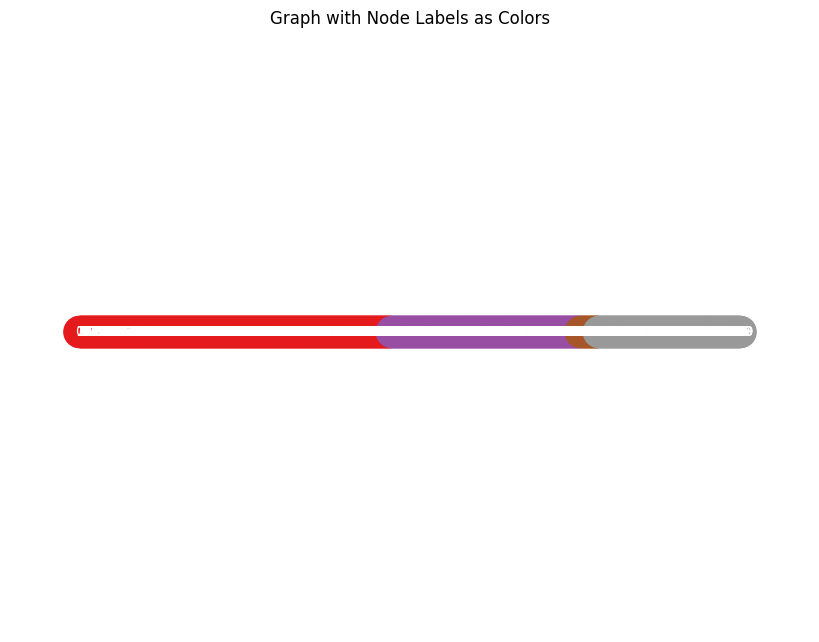

In [26]:
def plot_graph(graph):
    """
    Plots the graph with nodes having the same label in the same color.

    graph: A DGLGraph to plot.
    """
    import matplotlib.pyplot as plt
    import networkx as nx

    # Convert to NetworkX graph for visualization
    nx_graph = graph.to_networkx()

    # Extract labels
    labels = graph.ndata['label'].numpy()

    # Assign colors based on labels
    unique_labels = set(labels)
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    node_colors = [color_map[label] for label in labels]

    # Ensure 2D positions for plotting
    pos = graph.ndata['pos'][:, :2]  # Take only the first two dimensions

    # Plot the graph
    plt.figure(figsize=(8, 6))
    nx.draw(
        nx_graph,
        pos=pos.numpy(),  # Convert tensor to numpy
        node_color=node_colors,
        with_labels=True,
        cmap=plt.cm.Set1,
        node_size=500,
        font_size=10,
        font_color="white",
    )
    plt.title("Graph with Node Labels as Colors")
    plt.show()

plot_graph(graph)


In [27]:
from mpl_toolkits.mplot3d import Axes3D

# The graph to visualize
G = graph.to_networkx()

# 3d spring layout
pos = graph.ndata['pos']
# Extract node and edge positions from the layout
node_xyz = np.array([pos[v] for v in sorted(G)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in G.edges()])

# Create the 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Plot the nodes - alpha is scaled by "depth" automatically
ax.scatter(*node_xyz.T, s=100, ec="w")

# Plot the edges
for vizedge in edge_xyz:
    ax.plot(*vizedge.T, color="tab:gray")


def _format_axes(ax):
    """Visualization options for the 3D axes."""
    # Turn gridlines off
    ax.grid(False)
    # Suppress tick labels
    for dim in (ax.xaxis, ax.yaxis, ax.zaxis):
        dim.set_ticks([])
    # Set axes labels
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")


_format_axes(ax)
fig.tight_layout()
plt.show()

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (841,) + inhomogeneous part.

In [25]:
!pip install --upgrade pyvista
import pyvista as pv

   ---------------------------------------- 0.0/2.4 MB ? eta -:--:--
   ---------------------------------------- 2.4/2.4 MB 67.2 MB/s eta 0:00:00
  Attempting uninstall: pyvista
    Found existing installation: pyvista 0.39.0
    Uninstalling pyvista-0.39.0:
      Successfully uninstalled pyvista-0.39.0



[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
# Extraction des points
points = df_wgr.iloc[:, 1:4].values

# Vérification des dimensions
print("Shape of points:", points.shape)

# Création de l'objet PolyData
point_cloud = pv.PolyData(points)

# Vérification des dimensions des tableaux avant l'affectation
labels = graph.ndata['label'].numpy()
gr_values = df_wgr.iloc[:, 0].values

print("Shape of labels:", labels.shape)
print("Shape of gr_values:", gr_values.shape)

# S'assurer que les dimensions correspondent
if labels.shape[0] == points.shape[0]:
    point_cloud["label"] = labels
else:
    print("Dimension mismatch: labels")

if gr_values.shape[0] == points.shape[0]:
    point_cloud["gr"] = gr_values
else:
    print("Dimension mismatch: gr_values")

# Vérification du PolyData
print(point_cloud)

Shape of points: (841, 3)
Shape of labels: (841,)
Shape of gr_values: (841,)
PolyData (0x167005af0a0)
  N Cells:    841
  N Points:   841
  N Strips:   0
  X Bounds:   6.001e+03, 6.841e+03
  Y Bounds:   4.867e+01, 4.867e+01
  Z Bounds:   2.145e+00, 2.145e+00
  N Arrays:   2



In [27]:
print(df_tops.columns)  # Vérifie si 'wellName' existe
print(df_tops.head())  # Affiche les premières lignes


Index(['MARCEL', 'CONRAD', 'SYLVAIN'], dtype='object')
             MARCEL  CONRAD  SYLVAIN
wellName                            
512320698.0  6398.0  6661.0   6638.0
512320699.0  6407.0  6676.0   6656.0
512320928.0  6520.0  6793.0   6746.0
512320970.0  6544.0  6816.0   6770.0
512320971.0  6510.0  6789.0   6742.0


## MODEL

In [28]:
import torch
from torch.utils.data import Dataset, DataLoader
import dgl
import dgl.nn.pytorch as dglnn
import torch.nn.functional as F
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
import matplotlib.colors as colors

In [29]:
def step_function(start_depth, end_depth, tops_depth):
    if not tops_depth or start_depth >= end_depth:
        return [(start_depth, 1)]
    step_values = []
    current_value = 1
    for depth in range(start_depth + 1, end_depth + 1):
        if depth in tops_depth:
            current_value += 1
        step_values.append((depth, current_value))
    #creation labels
    return step_values

In [30]:
class WellGraphDataset(Dataset):
    def __init__(self, df_log, df_tops, input_variable, start_depth=start_depth, max_wells=3):
        self.df_log = df_log
        self.df_tops = df_tops
        self.input_variable = input_variable
        self.start_depth = start_depth
        self.well_names = df_log['wellName'].unique()[:max_wells]

    def __len__(self):
        return len(self.well_names)

    def __getitem__(self, idx):
        well = self.well_names[idx]
        start_time = time.time()
        if well not in self.df_log['wellName'].values:
            return dgl.graph(([], []))
        #filtre
        df_wgr = Well_grlog_cleaning(well, self.df_log, self.input_variable)
        df_wgr = df_wgr[df_wgr['Depth'] > self.start_depth]
        if df_wgr.empty:
            return dgl.graph(([], []))
        tops_list = self.df_tops.loc[well].dropna().tolist() if well in self.df_tops.index else []
        end_depth = df_wgr['Depth'].max()
        #labelise
        labels = step_function(self.start_depth, end_depth, sorted(tops_list))
        if time.time() - start_time > 10:
            return dgl.graph(([], []))
        #creation du graph
        graph = create_graph(df_wgr, labels)
        if graph.num_nodes() == 0:
            #ajoute un noeud si aucun noeud présent
            graph.add_nodes(1)
            graph.ndata['features'] = torch.zeros(1, len(self.input_variable), dtype=torch.float32)
            graph.ndata['pos'] = torch.zeros(1, 3, dtype=torch.float32)
            graph.ndata['label'] = torch.tensor([0], dtype=torch.int64)
        return graph

def collate_graphs(samples):
    valid_graphs = [g for g in samples if g.num_nodes() > 0]
    if len(valid_graphs) == 0:
        return dgl.graph(([], []))
    #aggrege les graphes pour le dataloader
    return dgl.batch(valid_graphs)

In [31]:
class WellGraphDataset(Dataset):
    def __init__(self, df_log, df_tops, input_variable, start_depth=6000, max_wells=None, well_names=None):
        self.df_log = df_log
        self.df_tops = df_tops
        self.input_variable = input_variable
        self.start_depth = start_depth
        
        # If well_names is provided, use those specific wells
        if well_names is not None:
            self.well_names = well_names
        else:
            # Otherwise, use the first max_wells from df_log
            self.well_names = df_log['wellName'].unique()[:max_wells] if max_wells else df_log['wellName'].unique()
        
        # Compute fallback tops once - this was missing in your code
        self.fallback_tops = df_tops.median().tolist() if not df_tops.empty else []

    def __len__(self):
        return len(self.well_names)

    def __getitem__(self, idx):
        well = self.well_names[idx]
        start_time = time.time()
        if well not in self.df_log['wellName'].values:
            return dgl.graph(([], []))
        df_wgr = Well_grlog_cleaning(well, self.df_log, self.input_variable)
        df_wgr = df_wgr[df_wgr['Depth'] > self.start_depth]
        if df_wgr.empty:
            return dgl.graph(([], []))

        # Use tops from df_tops if available; otherwise, use fallback tops.
        if well in self.df_tops.index:
            tops_list = self.df_tops.loc[well].dropna().tolist()
        else:
            tops_list = self.fallback_tops

        end_depth = df_wgr['Depth'].max()
        labels = step_function(self.start_depth, end_depth, sorted(tops_list))
        if time.time() - start_time > 10:
            return dgl.graph(([], []))
        graph = create_graph(df_wgr, labels)
        if graph.num_nodes() == 0:
            graph.add_nodes(1)
            graph.ndata['features'] = torch.zeros(1, len(self.input_variable), dtype=torch.float32)
            graph.ndata['pos'] = torch.zeros(1, 3, dtype=torch.float32)
            graph.ndata['label'] = torch.tensor([0], dtype=torch.int64)
        return graph

In [32]:
"""MODEL"""
class GraphSAGE(torch.nn.Module):
    def __init__(self, in_feats, hidden_sizes, n_classes, dropout=0.1, agg_type='pool'):
        """
        Construit un modèle GraphSAGE avec plusieurs couches de tailles différentes.
        Chaque couche est suivie d'une Batch Normalization, d'une activation ReLU
        et d'un dropout pour améliorer la stabilité de l'entraînement.
        """
        super(GraphSAGE, self).__init__()
        self.sage_layers = torch.nn.ModuleList()
        self.bns = torch.nn.ModuleList()
        
        # Create layers with specified hidden sizes
        prev_size = in_feats
        for h in hidden_sizes:
            self.sage_layers.append(dglnn.SAGEConv(prev_size, h, agg_type))
            self.bns.append(torch.nn.BatchNorm1d(h))
            prev_size = h
            
        self.fc = torch.nn.Linear(prev_size, n_classes)  # Couche linéaire finale
        self.dropout = torch.nn.Dropout(dropout)         # Dropout
        self.activation = F.relu                         # Activation (GraphSAGE typically uses ReLU)

    def forward(self, g, features):
        h = features
        for sage, bn in zip(self.sage_layers, self.bns):
            # Pour chaque couche, applique la convolution SAGE, la normalisation, l'activation et le dropout
            h = sage(g, h)
            h = self.activation(h)
            h = bn(h)
            h = self.dropout(h)
        out = self.fc(h)
        return out

In [33]:
"""FOCAL LOSS & POST TRAITEMENT"""
def focal_loss(pred, target, gamma=1.0, alpha=None, reduction="mean"):
    """
    Calcule la focal loss.
    - gamma : contrôle le degré de focalisation sur les exemples difficiles (proche de 1 rend la loss similaire à l'entropie croisée).
    - alpha : permet de pondérer différemment les classes.
    """
    ce_loss = F.cross_entropy(pred, target, reduction="none", weight=alpha)
    pt = torch.exp(-ce_loss)
    focal_loss_val = ((1 - pt) ** gamma) * ce_loss
    if reduction == "mean":
        return focal_loss_val.mean()
    elif reduction == "sum":
        return focal_loss_val.sum()
    else:
        return focal_loss_val

def post_process_predictions(preds, window_size=5):
    """
    Applique un filtrage médian sur les prédictions pour lisser les fluctuations.
    """
    processed_preds = preds.copy()
    for i in range(len(preds)):
        start = max(0, i - window_size // 2)
        end = min(len(preds), i + window_size // 2 + 1)
        processed_preds[i] = np.median(preds[start:end])
    return processed_preds.astype(int)

def refine_boundary_predictions(preds, window_size=5, method="median"):
    """
    Applies a sliding window aggregation to smooth predictions at boundary points.
    You can choose between "mean" or "median" aggregation.
    """
    refined_preds = preds.copy()
    for i in range(len(preds)):
        start = max(0, i - window_size // 2)
        end = min(len(preds), i + window_size // 2 + 1)
        if method == "mean":
            refined_preds[i] = np.mean(preds[start:end])
        else:  # default to median
            refined_preds[i] = np.median(preds[start:end])
    return refined_preds.astype(int)

In [34]:
def train_graphsage(model, train_dataloader, optimizer, criterion, scheduler, n_classes, epochs=50):
    model.train()
    
    loss_history = []
    accuracy_history = []
    precision_history = []
    recall_history = []
    f1_history = []

    for epoch in range(epochs):
        total_loss = 0.0
        all_preds, all_labels = [], []
        for batch_graphs in train_dataloader:
            # Skip empty batches
            if batch_graphs.num_nodes() == 0:
                continue
                
            # Move to device and add self-loops
            batch_graphs = batch_graphs.to(device)
            batch_graphs = dgl.add_self_loop(batch_graphs)
            
            optimizer.zero_grad()
            
            # Check if required data is present
            if 'features' not in batch_graphs.ndata or 'label' not in batch_graphs.ndata:
                continue
                
            features = batch_graphs.ndata['features']
            labels = batch_graphs.ndata['label']
            
            # Ajuste les labels pour avoir une échelle de 0 à n_classes-1
            labels_adjusted = torch.clamp(labels - 1, 0, n_classes - 1)
            
            # Skip if no valid labels
            if labels_adjusted.numel() == 0:
                continue
                
            pred = model(batch_graphs, features)
            loss = criterion(pred, labels_adjusted)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
            
            preds = pred.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels_adjusted.cpu().numpy())
        
        # Calculate metrics if we have predictions
        if len(all_labels) > 0:
            avg_loss = total_loss / len(train_dataloader)
            accuracy = accuracy_score(all_labels, all_preds)
            precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
            recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
            f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
            
            loss_history.append(avg_loss)
            accuracy_history.append(accuracy)
            precision_history.append(precision)
            recall_history.append(recall)
            f1_history.append(f1)
            
            print(f'📢 Epoch {epoch+1}/{epochs} → Loss: {avg_loss:.4f}, Accuracy: {accuracy:.4f}, '
                  f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}')
        else:
            print(f'⚠ Epoch {epoch+1}/{epochs} → No valid data, skipping metric calculation.')
        
        # Update learning rate
        scheduler.step()
    
    # Return training history for plotting
    return loss_history, accuracy_history, precision_history, recall_history, f1_history

In [35]:
import time

In [36]:
def train_graphsage(model, train_dataloader, optimizer, criterion, scheduler, n_classes, 
                          epochs=50, patience=10, max_time_minutes=30, device = device):
    model = model.to(device)
    model.train()
    
    best_f1 = 0.0
    patience_counter = 0
    start_time = time.time()
    
    for epoch in range(epochs):
        # Check time limit
        elapsed_minutes = (time.time() - start_time) / 60
        if elapsed_minutes > max_time_minutes:
            print(f"Time limit of {max_time_minutes} minutes reached. Stopping training.")
            break
            
        total_loss = 0.0
        all_preds, all_labels = [], []
        
        for batch_graphs in train_dataloader:
            # Skip invalid batches
            if batch_graphs.num_nodes() == 0:
                continue
                
            # Process batch (simplified)
            batch_graphs = batch_graphs.to(device)
            batch_graphs = dgl.add_self_loop(batch_graphs)
            optimizer.zero_grad()
            
            features = batch_graphs.ndata['features']
            labels = batch_graphs.ndata['label']
            labels_adjusted = torch.clamp(labels - 1, 0, n_classes - 1)
            
            pred = model(batch_graphs, features)
            loss = criterion(pred, labels_adjusted)
            loss.backward()
            optimizer.step()
            
            # Track metrics
            preds = pred.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels_adjusted.cpu().numpy())
            total_loss += loss.item()
        
        # Calculate epoch metrics
        if len(all_labels) > 0:
            avg_loss = total_loss / len(train_dataloader)
            f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
            
            print(f'Epoch {epoch+1}/{epochs} → Loss: {avg_loss:.4f}, F1: {f1:.4f}')
            
            # Early stopping
            if f1 > best_f1:
                best_f1 = f1
                patience_counter = 0
            else:
                patience_counter += 1
                
            if patience_counter >= patience:
                print(f"Early stopping triggered after {epoch+1} epochs")
                break
        
        scheduler.step()
    
    return model

In [37]:
import torch
import torch.nn.functional as F
import numpy as np

def depth_aware_focal_loss(pred, target, depths, gamma=2.0, alpha=None, depth_weight_factor=3.0, transition_window=5, device=device):
    """
    An enhanced depth-aware focal loss that better identifies marker transitions.
    
    Parameters:
    - pred: Model predictions (logits)
    - target: Ground truth labels
    - depths: Corresponding depths for each sample
    - gamma: Focal loss focusing parameter
    - alpha: Class weighting
    - depth_weight_factor: Multiplier for high gradient regions
    - transition_window: Window size for detecting transitions
    """
    # Ensure all inputs are on the same device
    device = pred.device
    target = target.to(device)
    depths = depths.to(device)
    
    # Base cross-entropy loss with optional alpha weighting
    if alpha is not None:
        alpha = alpha.to(device)
        ce_loss = F.cross_entropy(pred, target, weight=alpha, reduction='none')
    else:
        ce_loss = F.cross_entropy(pred, target, reduction='none')
    
    # Focal loss component
    probs = F.softmax(pred, dim=1)
    pt = probs.gather(1, target.view(-1, 1)).squeeze()
    focal_weights = (1 - pt) ** gamma
    
    # Enhanced depth-aware weighting
    if len(depths) > transition_window:
        # Calculate depth differences with a sliding window for better transition detection
        depth_diffs = torch.zeros_like(depths)
        
        for i in range(len(depths) - transition_window + 1):
            # Use variance within window to detect transitions
            window = depths[i:i+transition_window]
            if i + transition_window//2 < len(depth_diffs):
                depth_diffs[i + transition_window//2] = torch.var(window)
        
        # Normalize variation scores
        if torch.max(depth_diffs) > torch.min(depth_diffs):
            norm_diffs = (depth_diffs - torch.min(depth_diffs)) / (torch.max(depth_diffs) - torch.min(depth_diffs) + 1e-8)
        else:
            norm_diffs = torch.zeros_like(depth_diffs)
        
        # Identify transition zones
        transition_threshold = torch.quantile(norm_diffs, 0.75)
        transition_mask = norm_diffs > transition_threshold
        
        # Create depth-based weights
        depth_weights = torch.ones_like(ce_loss)
        depth_weights[transition_mask] = depth_weight_factor
        
        # Combine weights
        combined_weights = focal_weights * depth_weights
    else:
        combined_weights = focal_weights
    
    # Apply weights to CE loss
    weighted_loss = ce_loss * combined_weights
    
    return weighted_loss.mean()

# Utility function for post-processing predictions
def post_process_predictions(preds, window_size=5):
    """
    Applies median filtering to smooth predictions.
    
    Parameters:
    - preds: Numpy array of predictions
    - window_size: Size of the sliding window for median filtering
    
    Returns:
    - Smoothed predictions
    """
    processed_preds = preds.copy()
    for i in range(len(preds)):
        start = max(0, i - window_size // 2)
        end = min(len(preds), i + window_size // 2 + 1)
        processed_preds[i] = np.median(preds[start:end])
    return processed_preds.astype(int)

def refine_boundary_predictions(preds, window_size=5, method="median"):
    """
    Applies sliding window aggregation to smooth predictions.
    
    Parameters:
    - preds: Numpy array of predictions
    - window_size: Size of the sliding window
    - method: Aggregation method ('mean' or 'median')
    
    Returns:
    - Smoothed predictions
    """
    refined_preds = preds.copy()
    for i in range(len(preds)):
        start = max(0, i - window_size // 2)
        end = min(len(preds), i + window_size // 2 + 1)
        if method == "mean":
            refined_preds[i] = np.mean(preds[start:end])
        else:  # default to median
            refined_preds[i] = np.median(preds[start:end])
    return refined_preds.astype(int)

In [38]:
def train_graphsage(model, train_dataloader, optimizer, criterion, scheduler, n_classes, device=device, epochs=50):
    model.to(device)
    model.train()
    loss_history = []
    accuracy_history = []
    precision_history = []
    recall_history = []
    f1_history = []
    lr_history = []  # Track learning rates
    
    for epoch in range(epochs):
        total_loss = 0.0
        all_preds, all_labels = [], []
        
        for batch_graphs in train_dataloader:
            # Skip empty batches
            if batch_graphs.num_nodes() == 0:
                continue
                
            # Ensure batch is on the correct device
            batch_graphs = batch_graphs.to(device)
            batch_graphs = dgl.add_self_loop(batch_graphs)
            
            optimizer.zero_grad()
            
            # Check if required data is present
            if 'features' not in batch_graphs.ndata or 'label' not in batch_graphs.ndata:
                continue
                
            # Move features and labels to the same device
            features = batch_graphs.ndata['features'].to(device)
            labels = batch_graphs.ndata['label'].to(device)
            
            # Extract depths from features (assuming depth is the second column)
            depths = features[:, 1].to(device)
            
            # Adjust labels to have a scale of 0 to n_classes-1
            labels_adjusted = torch.clamp(labels - 1, 0, n_classes - 1)
            
            # Skip if no valid labels
            if labels_adjusted.numel() == 0:
                continue
                
            # Compute model predictions
            pred = model(batch_graphs, features)
            
            # Prepare class weights if not already on the correct device
            if computed_weights is not None:
                weights = computed_weights.to(device)
            else:
                weights = None
                
            # Use depth-aware focal loss
            loss = depth_aware_focal_loss(
                pred,
                labels_adjusted,
                depths,
                gamma=2.0,  # Focal loss parameter
                alpha=weights,  # Class weights
                depth_weight_factor=3.0,  # Depth transition weight multiplier
                transition_window=5  # Window size for transition detection
            )
            
            loss.backward()
            
            # Apply gradient clipping to prevent exploding gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            
            optimizer.step()
            total_loss += loss.item()
            
            # Move predictions to CPU for metric calculation
            preds = pred.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels_adjusted.cpu().numpy())
            
            # Update learning rate with scheduler (for OneCycleLR, update each batch)
            scheduler.step()
        
        # Calculate metrics if we have predictions
        if len(all_labels) > 0:
            avg_loss = total_loss / len(train_dataloader)
            accuracy = accuracy_score(all_labels, all_preds)
            precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
            recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
            f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
            
            loss_history.append(avg_loss)
            accuracy_history.append(accuracy)
            precision_history.append(precision)
            recall_history.append(recall)
            f1_history.append(f1)
            
            # Track current learning rate
            current_lr = optimizer.param_groups[0]['lr']
            lr_history.append(current_lr)
            
            print(f'📢 Epoch {epoch+1}/{epochs} → Loss: {avg_loss:.4f}, Accuracy: {accuracy:.4f}, '
                  f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}, LR: {current_lr:.6f}')
        else:
            print(f'⚠ Epoch {epoch+1}/{epochs} → No valid data, skipping metric calculation.')
    
    # Add learning rate plot
    plt.figure(figsize=(12, 4))
    plt.plot(lr_history)
    plt.title('Learning Rate Schedule')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.grid(True)
    plt.show()
    
    # Return training history for plotting
    return loss_history, accuracy_history, precision_history, recall_history, f1_history

In [39]:
# Define the proportion of data to use for training 
train_ratio = 0.8

# Get all well names you want to use
well_list = df_log['wellName'].unique()
total_wells = len(well_list)

# Calculate the number of wells for training
train_size = int(total_wells * train_ratio)

# Randomly shuffle the well indices for splitting
indices = list(range(total_wells))
np.random.shuffle(indices)

# Split indices into training and testing
train_indices = indices[:train_size]
test_indices = indices[train_size:]

# Get the well names for training and testing
train_wells = [well_list[i] for i in train_indices]
test_wells = [well_list[i] for i in test_indices]

# Create separate datasets for training and testing
train_dataset = WellGraphDataset(df_log, df_tops, input_variable, well_names=train_wells)
test_dataset = WellGraphDataset(df_log, df_tops, input_variable, well_names=test_wells)

# Create separate dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_graphs)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_graphs)

In [40]:
def compute_class_weights(dataset, n_classes):
    """Dynamically compute class weights based on dataset distribution"""
    # Initialize class counts
    class_counts = np.zeros(n_classes)
    
    # Count occurrences of each class
    for i in range(len(dataset)):
        graph = dataset[i]
        if graph.num_nodes() > 0 and 'label' in graph.ndata:
            labels = graph.ndata['label'].numpy()
            # Adjust labels to 0-indexed
            labels_adjusted = np.clip(labels - 1, 0, n_classes - 1)
            # Count each class
            for c in range(n_classes):
                class_counts[c] += np.sum(labels_adjusted == c)
    
    # Ensure no zeros
    class_counts = np.maximum(class_counts, 1e-5)
    
    # The issue is here - the formula is causing extremely small values
    # Let's use a simpler inverse frequency weighting
    
    # Calculate inverse frequency weighting
    total_samples = np.sum(class_counts)
    weights = total_samples / (class_counts * n_classes)
    
    # Cap maximum weight to avoid extreme values
    weights = np.minimum(weights, 10.0)
    
    print(f"Class counts: {class_counts}")
    print(f"Computed weights: {weights}")
    
    return torch.tensor(weights, dtype=torch.float32)

In [41]:
# Class weights - still useful for handling class imbalance
computed_weights = compute_class_weights(train_dataset, len(df_tops.columns) + 1)
print("Poids utilisés pour les classes:", computed_weights.numpy())

train_ratio = 0.8
well_list = df_log['wellName'].unique()
total_wells = len(well_list)
train_size = int(total_wells * train_ratio)

# Split wells into training and testing sets
indices = list(range(total_wells))
np.random.shuffle(indices)
train_indices = indices[:train_size]
test_indices = indices[train_size:]
train_wells = [well_list[i] for i in train_indices]
test_wells = [well_list[i] for i in test_indices]

# Create datasets and dataloaders
train_dataset = WellGraphDataset(df_log, df_tops, input_variable, well_names=train_wells)
test_dataset = WellGraphDataset(df_log, df_tops, input_variable, well_names=test_wells)
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_graphs)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_graphs)

Class counts: [232232. 102476.  18608.  91024.]
Computed weights: [0.47833632 1.08400991 5.9697442  1.22039242]
Poids utilisés pour les classes: [0.4783363 1.0840099 5.969744  1.2203925]


In [42]:
in_features = len(input_variable)
hidden_sizes = [16, 64, 128, 128, 16]  # Keep your same hidden layer sizes
n_classes = len(df_tops.columns) + 1

# Create the GraphSAGE model instead of ImprovedGNN
model = GraphSAGE(in_features, hidden_sizes, n_classes, dropout=0.1, agg_type='mean')
criterion = lambda pred, target: focal_loss(
    pred, 
    target, 
    gamma=1.0, 
    alpha=computed_weights.to(pred.device)
)

optimizer = torch.optim.Adam(model.parameters(), lr=0.003)
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=0.01,  # Peak learning rate
    steps_per_epoch=len(train_dataloader),  # Use train_dataloader to calculate steps
    epochs=20,
    pct_start=0.3,
    div_factor=25,  # Initial learning rate is max_lr/div_factor
    final_div_factor=10000,  # Final learning rate is max_lr/final_div_factor  # 30% of training spent increasing learning rate
    anneal_strategy='cos'
)


 

## TRAINING

📢 Epoch 1/20 → Loss: 0.4458, Accuracy: 0.7071, Precision: 0.7454, Recall: 0.7071, F1: 0.7181, LR: 0.001044
📢 Epoch 2/20 → Loss: 0.4037, Accuracy: 0.7195, Precision: 0.7578, Recall: 0.7195, F1: 0.7299, LR: 0.002803
📢 Epoch 3/20 → Loss: 0.4074, Accuracy: 0.7293, Precision: 0.7653, Recall: 0.7293, F1: 0.7392, LR: 0.005205
📢 Epoch 4/20 → Loss: 0.4088, Accuracy: 0.7168, Precision: 0.7563, Recall: 0.7168, F1: 0.7278, LR: 0.007606
📢 Epoch 5/20 → Loss: 0.4038, Accuracy: 0.7209, Precision: 0.7613, Recall: 0.7209, F1: 0.7318, LR: 0.009361
📢 Epoch 6/20 → Loss: 0.4111, Accuracy: 0.7300, Precision: 0.7681, Recall: 0.7300, F1: 0.7403, LR: 0.010000
📢 Epoch 7/20 → Loss: 0.3894, Accuracy: 0.7320, Precision: 0.7692, Recall: 0.7320, F1: 0.7418, LR: 0.009874
📢 Epoch 8/20 → Loss: 0.3896, Accuracy: 0.7319, Precision: 0.7693, Recall: 0.7319, F1: 0.7421, LR: 0.009503
📢 Epoch 9/20 → Loss: 0.3800, Accuracy: 0.7410, Precision: 0.7778, Recall: 0.7410, F1: 0.7500, LR: 0.008906
📢 Epoch 10/20 → Loss: 0.3879, Accurac

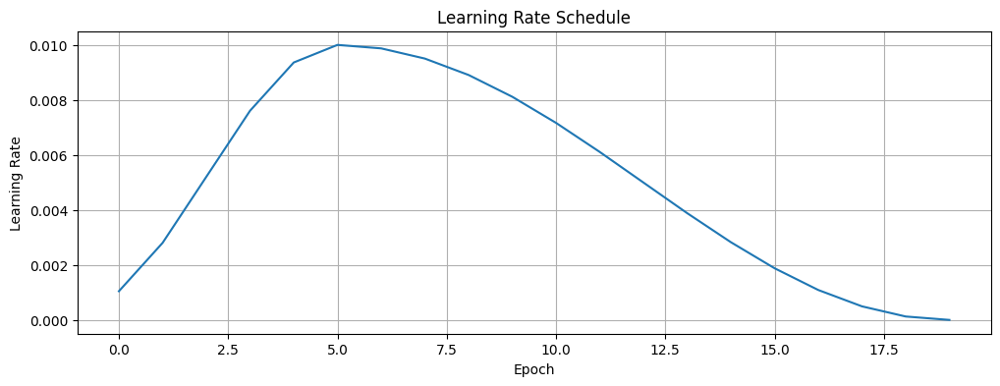

done


In [ ]:
train_graphsage(model, train_dataloader, optimizer, criterion, scheduler, n_classes, device=device, epochs=20)

## LOAD THE MODEL

In [43]:
model.load_state_dict(torch.load('graphsage_model.pth'))
model.eval()  # Set to evaluation mode if making predictions

GraphSAGE(
  (sage_layers): ModuleList(
    (0): SAGEConv(
      (feat_drop): Dropout(p=0.0, inplace=False)
      (fc_neigh): Linear(in_features=4, out_features=16, bias=False)
      (fc_self): Linear(in_features=4, out_features=16, bias=True)
    )
    (1): SAGEConv(
      (feat_drop): Dropout(p=0.0, inplace=False)
      (fc_neigh): Linear(in_features=16, out_features=64, bias=False)
      (fc_self): Linear(in_features=16, out_features=64, bias=True)
    )
    (2): SAGEConv(
      (feat_drop): Dropout(p=0.0, inplace=False)
      (fc_neigh): Linear(in_features=64, out_features=128, bias=False)
      (fc_self): Linear(in_features=64, out_features=128, bias=True)
    )
    (3): SAGEConv(
      (feat_drop): Dropout(p=0.0, inplace=False)
      (fc_neigh): Linear(in_features=128, out_features=128, bias=False)
      (fc_self): Linear(in_features=128, out_features=128, bias=True)
    )
    (4): SAGEConv(
      (feat_drop): Dropout(p=0.0, inplace=False)
      (fc_neigh): Linear(in_features=128

## EVALUATING


Evaluating GraphSAGE model on test data...

Évaluation sur le dataset de test (Prédictions Brutes):
   Accuracy : 0.6859
   Precision: 0.7379
   Recall   : 0.6859
   F1 Score : 0.6948

Rapport de classification (Brutes) :
              precision    recall  f1-score   support

           0       0.92      0.68      0.78     59430
           1       0.50      0.62      0.55     24874
           2       0.60      0.44      0.51      5938
           3       0.57      0.85      0.68     23812

    accuracy                           0.69    114054
   macro avg       0.65      0.64      0.63    114054
weighted avg       0.74      0.69      0.69    114054



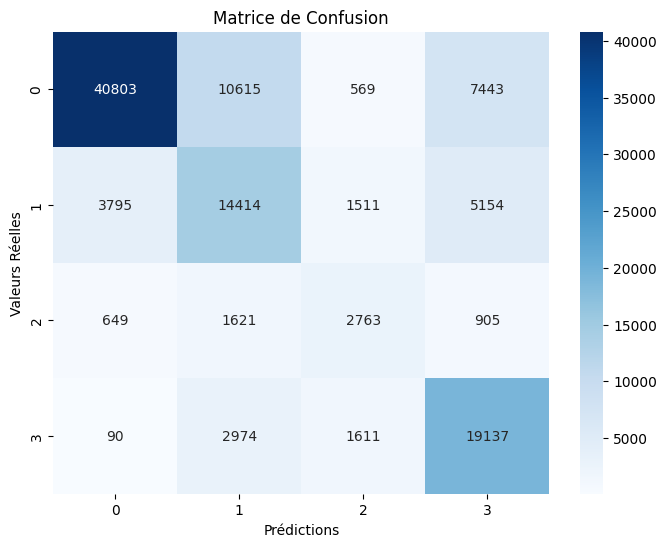


📢 Évaluation sur le dataset de test (Prédictions Post-traitées):
   Accuracy : 0.6761
   Precision: 0.7198
   Recall   : 0.6761
   F1 Score : 0.6860

Rapport de classification (Post-traitées) :
              precision    recall  f1-score   support

           0       0.90      0.69      0.78     59430
           1       0.49      0.58      0.53     24874
           2       0.43      0.47      0.45      5938
           3       0.59      0.80      0.68     23812

    accuracy                           0.68    114054
   macro avg       0.60      0.63      0.61    114054
weighted avg       0.72      0.68      0.69    114054



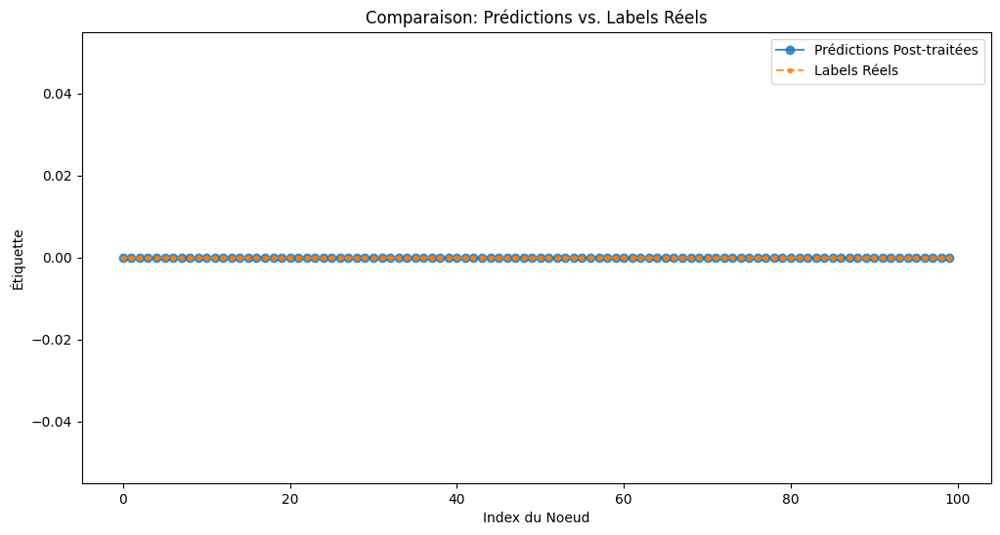

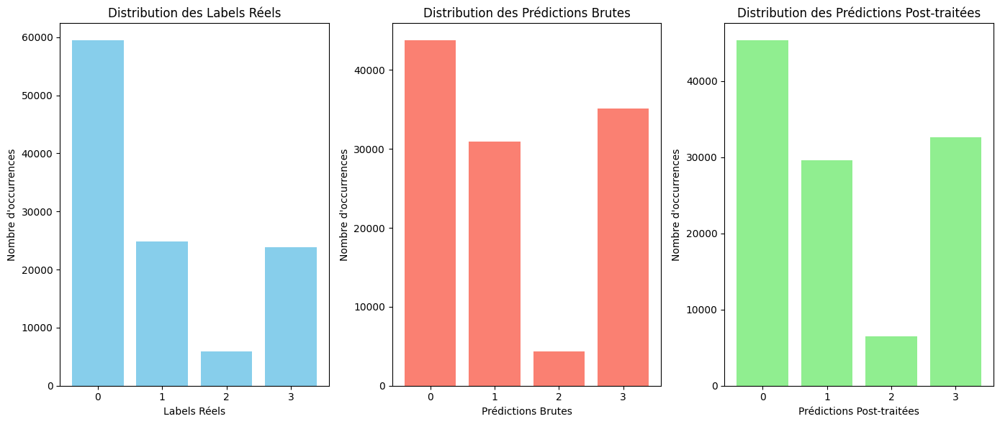

In [44]:
# Evaluation on test data
print("\nEvaluating GraphSAGE model on test data...")
model.eval()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

all_raw_preds = []
all_labels_adjusted = []

# Process all test batches
with torch.no_grad():
    for batch in test_dataloader:
        if batch.num_nodes() == 0:
            continue
            
        batch = batch.to(device)
        batch = dgl.add_self_loop(batch)
        
        # Make predictions
        raw_preds = model(batch, batch.ndata['features']).argmax(dim=1).cpu().numpy()
        labels = batch.ndata['label'].cpu().numpy()
        labels_adjusted = np.clip(labels-1, 0, n_classes - 1)
        
        # Collect predictions and labels
        all_raw_preds.extend(raw_preds)
        all_labels_adjusted.extend(labels_adjusted)

# Convert to numpy arrays
all_raw_preds = np.array(all_raw_preds)
all_labels_adjusted = np.array(all_labels_adjusted)

# Calculate metrics for raw predictions
test_accuracy = accuracy_score(all_labels_adjusted, all_raw_preds)
test_precision = precision_score(all_labels_adjusted, all_raw_preds, average='weighted', zero_division=0)
test_recall = recall_score(all_labels_adjusted, all_raw_preds, average='weighted', zero_division=0)
test_f1 = f1_score(all_labels_adjusted, all_raw_preds, average='weighted', zero_division=0)

print("\nÉvaluation sur le dataset de test (Prédictions Brutes):")
print(f"   Accuracy : {test_accuracy:.4f}")
print(f"   Precision: {test_precision:.4f}")
print(f"   Recall   : {test_recall:.4f}")
print(f"   F1 Score : {test_f1:.4f}")
print("\nRapport de classification (Brutes) :")
print(classification_report(all_labels_adjusted, all_raw_preds, zero_division=0))

# Application du post-processing
processed_preds = refine_boundary_predictions(all_raw_preds, window_size=5, method="mean")

# Confusion Matrix
cm_raw = confusion_matrix(all_labels_adjusted, processed_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_raw, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Prédictions")
plt.ylabel("Valeurs Réelles")
plt.title("Matrice de Confusion")
plt.show()

# Calcul des métriques post traitement
proc_accuracy = accuracy_score(all_labels_adjusted, processed_preds)
proc_precision = precision_score(all_labels_adjusted, processed_preds, average='weighted', zero_division=0)
proc_recall = recall_score(all_labels_adjusted, processed_preds, average='weighted', zero_division=0)
proc_f1 = f1_score(all_labels_adjusted, processed_preds, average='weighted', zero_division=0)

print("\n📢 Évaluation sur le dataset de test (Prédictions Post-traitées):")
print(f"   Accuracy : {proc_accuracy:.4f}")
print(f"   Precision: {proc_precision:.4f}")
print(f"   Recall   : {proc_recall:.4f}")
print(f"   F1 Score : {proc_f1:.4f}")
print("\nRapport de classification (Post-traitées) :")
print(classification_report(all_labels_adjusted, processed_preds, zero_division=0))

# Sample visualization for a subset of data (first 100 points or less)
visualization_size = min(100, len(all_labels_adjusted))

# Graphique 1 : Comparaison des prédictions et réels
plt.figure(figsize=(12, 6))
plt.plot(processed_preds[:visualization_size], label="Prédictions Post-traitées", marker='o', linestyle='-', alpha=0.8)
plt.plot(all_labels_adjusted[:visualization_size], label="Labels Réels", marker='.', linestyle='--', alpha=0.8)
plt.xlabel("Index du Noeud")
plt.ylabel("Étiquette")
plt.title("Comparaison: Prédictions vs. Labels Réels")
plt.legend()
plt.show()

# Graphique 2 : Histogrammes de distribution
plt.figure(figsize=(14, 6))

plt.subplot(1, 3, 1)
unique_actual, counts_actual = np.unique(all_labels_adjusted, return_counts=True)
plt.bar(unique_actual, counts_actual, color='skyblue')
plt.xlabel("Labels Réels")
plt.ylabel("Nombre d'occurrences")
plt.title("Distribution des Labels Réels")

plt.subplot(1, 3, 2)
unique_raw, counts_raw = np.unique(all_raw_preds, return_counts=True)
plt.bar(unique_raw, counts_raw, color='salmon')
plt.xlabel("Prédictions Brutes")
plt.ylabel("Nombre d'occurrences")
plt.title("Distribution des Prédictions Brutes")

plt.subplot(1, 3, 3)
unique_proc, counts_proc = np.unique(processed_preds, return_counts=True)
plt.bar(unique_proc, counts_proc, color='lightgreen')
plt.xlabel("Prédictions Post-traitées")
plt.ylabel("Nombre d'occurrences")
plt.title("Distribution des Prédictions Post-traitées")

plt.tight_layout()
plt.show()

In [45]:
def plot_well_side_by_side(df_well, actual_labels, predicted_labels, well_name=None):
    #GR et Depth comme dans l'exemple
    gr = np.array(df_well['GR'])
    depth = np.array(df_well['Depth'])

    actual_labels = np.array(actual_labels)
    predicted_labels = np.array(predicted_labels)

    boundaries = np.arange(0.5, 5.5, 1)
    norm = colors.BoundaryNorm(boundaries, ncolors=10)

    # 2 plot : Actuals vs Predicted
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

    sc1 = axes[0].scatter(gr, depth, c=actual_labels, cmap='tab10', s=20, norm=norm)
    axes[0].invert_yaxis()
    axes[0].set_xlabel("GR")
    axes[0].set_ylabel("Depth (ft)")
    axes[0].set_title(f"Actual Marker Labels\n{well_name}" if well_name else "Actual Marker Labels")

    sc2 = axes[1].scatter(gr, depth, c=predicted_labels, cmap='tab10', s=20, norm=norm)
    axes[1].invert_yaxis()
    axes[1].set_xlabel("GR")
    axes[1].set_title("Predicted Marker Labels")

    # Legende : colorbar
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.03, 0.7])
    cbar = fig.colorbar(sc2, cax=cbar_ax, ticks=[1, 2, 3, 4])
    cbar.set_label("Marker Label")

    plt.tight_layout(rect=[0, 0, 0.82, 1])
    plt.show()

In [46]:
def plot_well_from_name(well, df_log, df_tops, input_variable, model):
    #Initialise les données
    df_wgr = Well_grlog_cleaning(well, df_log, input_variable)
    df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
    df_wgr = df_wgr.dropna(subset=['Depth'])
    if df_wgr.empty:
        print(f"No valid depth data for well {well}")
        return

    if well in df_tops.index:
        tops_list = df_tops.loc[well].dropna().tolist()
    else:
        tops_list = []
    end_depth = int(df_wgr['Depth'].max())
    step_vals = step_function(start_depth, end_depth, sorted(tops_list))

    #Creation du graphe
    graph = create_graph(df_wgr, step_vals)
    graph = dgl.add_self_loop(graph)
    #Récupère les labels
    actual_labels = graph.ndata['label'].cpu().numpy()
    graph = graph.to(device)

    #Run le model
    model.eval()
    with torch.no_grad():
        preds = model(graph, graph.ndata['features'])
        predicted_labels = preds.argmax(dim=1).cpu().numpy()
        predicted_labels = post_process_predictions(predicted_labels, window_size=5)
        predicted_labels = predicted_labels+1

    #Plot
    plot_well_side_by_side(df_wgr, actual_labels, predicted_labels, well_name=well)


C:\Users\Alexa\AppData\Local\Temp\ipykernel_45948\1055520299.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.82, 1])


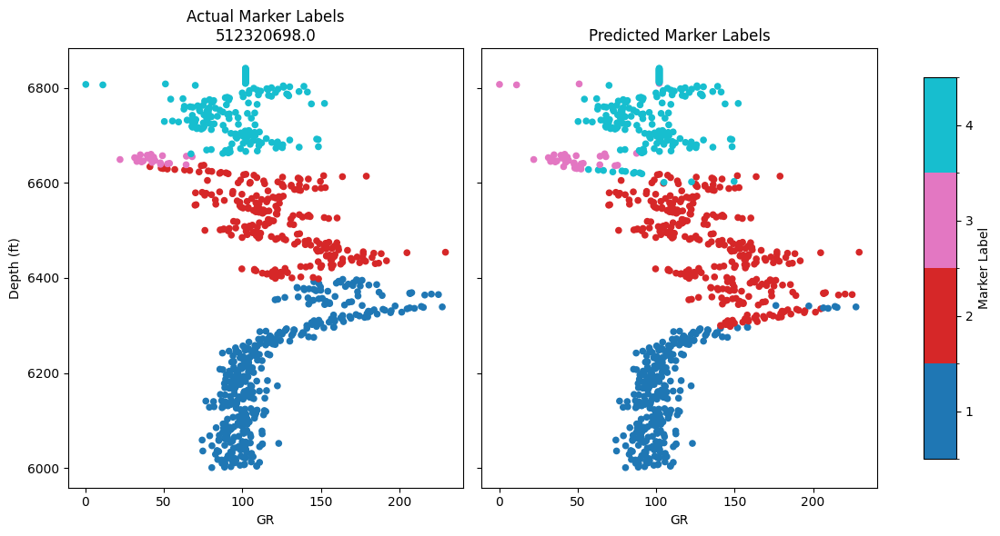

In [47]:
plot_well_from_name(well, df_log, df_tops, ['GR', 'Depth', 'Latitude', 'Longitude'], model)

## PREDICTING BOUNDARIES WITHOUT PROCESSING

In [48]:
def findIndex(a, n, key):
    start = -1

    # Traverse from beginning to find first occurrence
    for i in range(n):
        if a[i] == key:
            start = i
            break

    # Traverse from end to find last occurrence.
    end = -1
    if start >= 0:
        for i in range(start+4, n, 1):
            if a[i] != key and a[i-1] != key and a[i-2] != key and a[i-3] != key and a[i-4] != key:
                end = i-3
                break
    if end == -1:
        end = n-1

    return (start, end)

def predicted_marker_depth(pred_array, depth_array, con):
    arr = pred_array
    n = len(arr)
    if con == 'first':
        i = 0
        M_idx = findIndex(arr, n, 1)
        S_idx = findIndex(arr, n, 2)
        C_idx = findIndex(arr, n, 3)
    elif con == 'last':
        i = 1
        M_idx = findIndex(arr, n, 0)
        S_idx = findIndex(arr, n, 1)
        C_idx = findIndex(arr, n, 2)
    else:
        print('Please specify "first" or "last"')
        return (None, None, None)
    
    # Check if markers are found and get depths, ensuring indices are valid
    M_depth = depth_array[min(M_idx[i], len(depth_array)-1)] if M_idx[0] != -1 and M_idx[i] < len(depth_array) else depth_array[0]
    
    # For S marker, if not found or invalid index, use the transition between M and C
    if S_idx[0] != -1 and S_idx[i] < len(depth_array):
        S_depth = depth_array[S_idx[i]]
    elif M_idx[0] != -1 and C_idx[0] != -1 and M_idx[i] < len(depth_array) and C_idx[i] < len(depth_array):
        # Choose a point between M and C
        mid_point = (M_idx[i] + C_idx[i]) // 2
        S_depth = depth_array[min(mid_point, len(depth_array)-1)]
    else:
        # Fall back to a reasonable default - middle of the array
        S_depth = depth_array[len(depth_array)//2]
    
    # For C marker, if not found but others are, place it after S
    if C_idx[0] != -1 and C_idx[i] < len(depth_array):
        C_depth = depth_array[C_idx[i]]
    elif S_idx[0] != -1:
        # Place it right after S
        C_depth = S_depth + (depth_array[-1] - S_depth) / 2
    else:
        # Place it at the end
        C_depth = depth_array[-1]
    
    return (M_depth, S_depth, C_depth)

In [49]:
# only top 200, change the index as you want
# create well_list to make sure the wells are at the same time in the file df_log and df_tops
well_list=df_log['wellName'].unique().astype(int)
well_list=set(list(df_tops.index)).intersection(set(well_list))
well_list=list(well_list)

#dataset
dataset = WellGraphDataset(df_log, df_tops, input_variable, max_wells=200)
dataloader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=collate_graphs)

#generate df preds
num_well=200
df_preds=pd.DataFrame(columns = ['wellName','MARCEL', 'CONRAD','SYLVAIN' ])
new_data=[]
for index in range(num_well):
  # generate the depth and labels of corresponding well
  well=well_list[index]
  start_depth=start_depth
  # step function
  df_wgr = Well_grlog_cleaning(well, df_log,input_variable)
  df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
  tops_list = df_tops.loc[well].dropna().tolist()
  end_depth = df_wgr['Depth'].max()
  labels = step_function(start_depth, end_depth, sorted(tops_list)) #step_function的结果是对于每个深度，assign对应的marker label
  depth_array= [tup[0] for tup in labels]


  ##get preds
  model.eval()
  with torch.no_grad():
      batch = dataset[index]
      batch = dgl.add_self_loop(batch)
      batch = batch.to(device)
      preds = model(batch, batch.ndata['features']).argmax(dim=1).cpu().numpy()
      preds = post_process_predictions(preds, window_size=5)
      #preds = refine_boundary_predictions(preds, window_size=5, method="mean")
      labels = batch.ndata['label'].cpu().numpy()
      labels_adjusted = np.clip(labels - 1, 0, n_classes - 1)
  pred_array=preds
  m_m,m_c,m_s=predicted_marker_depth(pred_array, depth_array, 'last')
  new_data.append([well, m_m, m_c, m_s])
df_preds=pd.DataFrame(new_data, columns = ['wellName','MARCEL','CONRAD', 'SYLVAIN'])
df_preds.head()

,wellName,MARCEL,CONRAD,SYLVAIN
0,512329746.0,6299,6337,6664.0
1,512331798.0,6307,6619,6638.5
2,512325663.0,6386,6490,6795.0
3,512325664.0,6413,6640,6819.0
4,512331808.0,6380,6612,6659.5


In [50]:
## df actual

### garder only wells that could be found in df_log file
df_tops.reset_index(inplace=True)
df_tops_valide=df_tops[df_tops['wellName'].isin(well_list[:200])] #ATTENTION: should be the same well as df_preds
df_tops_valide.sort_values(by=['wellName'],inplace=True)
df_tops_valide.head()
df_tops_valide.set_index('wellName',inplace=True)
df_tops.set_index('wellName',inplace=True)
# df_tops_actual = df_tops.sort_values(by = ['wellName'])
# df_tops_actual = df_tops_actual.set_index('wellName')
# df_tops_actual.head()

C:\Users\Alexa\AppData\Local\Temp\ipykernel_45948\2120449443.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tops_valide.sort_values(by=['wellName'],inplace=True)


In [51]:
df_preds.set_index('wellName',inplace=True)
df_preds=df_preds.sort_index()
df_preds

,MARCEL,CONRAD,SYLVAIN
wellName,,,
512322228.0,6391,6396,6787.0
512322230.0,6422,6643,6807.0
512322231.0,6386,6615,6783.0
512322233.0,6371,6606,6783.0
512322243.0,6323,6365,6712.0
...,...,...,...
512332568.0,6371,6480,6798.0
512334023.0,6443,6630,6667.0
512334042.0,6408,6658,6831.0


In [52]:
def recall_tops(df_tops_true, df_tops_pred, tolerance = 10):

    if set(df_tops_true.columns) == set(df_tops_pred.columns) :
        concat_df = df_tops_true.copy()
        for col in df_tops_pred.columns:
            concat_df[col+"_pred"] = df_tops_pred[col]
        tp = 0
        p = 0
        mae = 0
        for col in df_tops_true:
            diffname = "{0}_ae".format(col)
            tpname = "{0}_tp".format(col)
            p += concat_df[col].count()
            concat_df[diffname] = concat_df[col]-concat_df[str(col + "_pred")]
            concat_df[diffname] = concat_df[diffname].abs()
            concat_df[tpname] = concat_df[diffname] <= tolerance
            tp += concat_df[tpname].sum()
            mae += concat_df[diffname].sum()
        return tp/p, mae/p, concat_df
    else :
        print("the tops columns are not valid")
    return None,None,None

In [53]:
recall, mae, df_res = recall_tops(df_tops_valide,df_preds,tolerance = 20)
print("recall {0}, mae {1}".format(recall,mae))
df_res

recall 0.06166666666666667, mae 181.16666666666666


,MARCEL,CONRAD,SYLVAIN,MARCEL_pred,CONRAD_pred,SYLVAIN_pred,MARCEL_ae,MARCEL_tp,CONRAD_ae,CONRAD_tp,SYLVAIN_ae,SYLVAIN_tp
wellName,,,,,,,,,,,,
512322228.0,6390.0,6660.0,6614.0,6391,6396,6787.0,1.0,True,264.0,False,173.0,False
512322230.0,6443.0,6714.0,6668.0,6422,6643,6807.0,21.0,False,71.0,False,139.0,False
512322231.0,6509.0,6812.0,6752.0,6386,6615,6783.0,123.0,False,197.0,False,31.0,False
512322233.0,6508.0,6776.0,6740.0,6371,6606,6783.0,137.0,False,170.0,False,43.0,False
512322243.0,6340.0,6602.0,6559.0,6323,6365,6712.0,17.0,True,237.0,False,153.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...
512332568.0,6533.0,6839.0,6814.0,6371,6480,6798.0,162.0,False,359.0,False,16.0,True
512334023.0,6288.0,6534.0,6510.0,6443,6630,6667.0,155.0,False,96.0,False,157.0,False
512334042.0,6264.0,6524.0,6500.0,6408,6658,6831.0,144.0,False,134.0,False,331.0,False


In [54]:
marcel_mae = df_res['MARCEL_ae'].mean()
conrad_mae = df_res['CONRAD_ae'].mean()
sylvain_mae = df_res['SYLVAIN_ae'].mean()

# Print the results
print(f"Average MAE for MARCEL: {marcel_mae:.2f}")
print(f"Average MAE for CONRAD: {conrad_mae:.2f}")
print(f"Average MAE for SYLVAIN: {sylvain_mae:.2f}")

# Overall average MAE across all markers
overall_mae = (marcel_mae + conrad_mae + sylvain_mae) / 3
print(f"Overall average MAE: {overall_mae:.2f}")

Average MAE for MARCEL: 133.70
Average MAE for CONRAD: 249.66
Average MAE for SYLVAIN: 160.15
Overall average MAE: 181.17


In [55]:
# only top 200, change the index as you want
# create well_list to make sure the wells are at the same time in the file df_log and df_tops
well_list=df_log['wellName'].unique().astype(int)
well_list=set(list(df_tops.index)).intersection(set(well_list))
well_list=list(well_list)

#dataset
dataset = WellGraphDataset(df_log, df_tops, input_variable, max_wells=200)
dataloader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=collate_graphs)

#generate df preds
num_well=200
df_preds=pd.DataFrame(columns = ['wellName','MARCEL', 'CONRAD','SYLVAIN' ])
new_data=[]
for index in range(num_well):
  # generate the depth and labels of corresponding well
  well=well_list[index]
  start_depth=start_depth
  # step function
  df_wgr = Well_grlog_cleaning(well, df_log,input_variable)
  df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
  tops_list = df_tops.loc[well].dropna().tolist()
  end_depth = df_wgr['Depth'].max()
  labels = step_function(start_depth, end_depth, sorted(tops_list)) #step_function的结果是对于每个深度，assign对应的marker label
  depth_array= [tup[0] for tup in labels]


  ##get preds
  model.eval()
  with torch.no_grad():
      batch = dataset[index]
      batch = dgl.add_self_loop(batch)
      batch = batch.to(device)
      preds = model(batch, batch.ndata['features']).argmax(dim=1).cpu().numpy()
      preds = post_process_predictions(preds, window_size=5)
      #preds = refine_boundary_predictions(preds, window_size=5, method="mean")
      labels = batch.ndata['label'].cpu().numpy()
      labels_adjusted = np.clip(labels - 1, 0, n_classes - 1)
  pred_array=preds
  m_m,m_c,m_s=predicted_marker_depth(pred_array, depth_array, 'last')
  new_data.append([well, m_m, m_c, m_s])
df_preds=pd.DataFrame(new_data, columns = ['wellName','MARCEL','CONRAD', 'SYLVAIN'])
df_preds.head()

,wellName,MARCEL,CONRAD,SYLVAIN
0,512329746.0,6299,6337,6664.0
1,512331798.0,6307,6619,6638.5
2,512325663.0,6386,6490,6795.0
3,512325664.0,6413,6640,6819.0
4,512331808.0,6380,6612,6659.5


In [56]:
## df actual

### garder only wells that could be found in df_log file
df_tops.reset_index(inplace=True)
df_tops_valide=df_tops[df_tops['wellName'].isin(well_list[:200])] #ATTENTION: should be the same well as df_preds
df_tops_valide.sort_values(by=['wellName'],inplace=True)
df_tops_valide.head()
df_tops_valide.set_index('wellName',inplace=True)
df_tops.set_index('wellName',inplace=True)
# df_tops_actual = df_tops.sort_values(by = ['wellName'])
# df_tops_actual = df_tops_actual.set_index('wellName')
# df_tops_actual.head()

C:\Users\Alexa\AppData\Local\Temp\ipykernel_45948\2120449443.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tops_valide.sort_values(by=['wellName'],inplace=True)


In [57]:
df_preds.set_index('wellName',inplace=True)
df_preds=df_preds.sort_index()
df_preds

,MARCEL,CONRAD,SYLVAIN
wellName,,,
512322228.0,6391,6396,6787.0
512322230.0,6422,6643,6807.0
512322231.0,6386,6615,6783.0
512322233.0,6371,6606,6783.0
512322243.0,6323,6365,6712.0
...,...,...,...
512332568.0,6371,6480,6798.0
512334023.0,6443,6630,6667.0
512334042.0,6408,6658,6831.0


In [58]:
recall, mae, df_res = recall_tops(df_tops_valide,df_preds,tolerance = 20)
print("recall {0}, mae {1}".format(recall,mae))
df_res

recall 0.06166666666666667, mae 181.16666666666666


,MARCEL,CONRAD,SYLVAIN,MARCEL_pred,CONRAD_pred,SYLVAIN_pred,MARCEL_ae,MARCEL_tp,CONRAD_ae,CONRAD_tp,SYLVAIN_ae,SYLVAIN_tp
wellName,,,,,,,,,,,,
512322228.0,6390.0,6660.0,6614.0,6391,6396,6787.0,1.0,True,264.0,False,173.0,False
512322230.0,6443.0,6714.0,6668.0,6422,6643,6807.0,21.0,False,71.0,False,139.0,False
512322231.0,6509.0,6812.0,6752.0,6386,6615,6783.0,123.0,False,197.0,False,31.0,False
512322233.0,6508.0,6776.0,6740.0,6371,6606,6783.0,137.0,False,170.0,False,43.0,False
512322243.0,6340.0,6602.0,6559.0,6323,6365,6712.0,17.0,True,237.0,False,153.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...
512332568.0,6533.0,6839.0,6814.0,6371,6480,6798.0,162.0,False,359.0,False,16.0,True
512334023.0,6288.0,6534.0,6510.0,6443,6630,6667.0,155.0,False,96.0,False,157.0,False
512334042.0,6264.0,6524.0,6500.0,6408,6658,6831.0,144.0,False,134.0,False,331.0,False


In [59]:
marcel_mae = df_res['MARCEL_ae'].mean()
conrad_mae = df_res['CONRAD_ae'].mean()
sylvain_mae = df_res['SYLVAIN_ae'].mean()

print(f"Average MAE for MARCEL: {marcel_mae:.2f}")
print(f"Average MAE for CONRAD: {conrad_mae:.2f}")
print(f"Average MAE for SYLVAIN: {sylvain_mae:.2f}")

overall_mae = (marcel_mae + conrad_mae + sylvain_mae) / 3
print(f"Overall average MAE: {overall_mae:.2f}")

Average MAE for MARCEL: 133.70
Average MAE for CONRAD: 249.66
Average MAE for SYLVAIN: 160.15
Overall average MAE: 181.17


In [60]:
df_tops_50 = pd.read_csv("./Testdata/tops_50.csv")
df_tops_100 = pd.read_csv("./Testdata/tops_100.csv")
df_loc_50 = pd.read_parquet("./Testdata/loc_50.parquet", engine='fastparquet')
df_log_50 = pd.read_parquet("./Testdata/logs_50.parquet", engine='fastparquet')
df_loc_100 = pd.read_parquet("./Testdata/loc_100.parquet", engine='fastparquet')
df_log_100 = pd.read_parquet("./Testdata/logs_100.parquet", engine='fastparquet')

In [61]:
df_tops_50.set_index('wellName', inplace = True)
df_tops_100.set_index('wellName', inplace = True)

In [62]:
df_tops_100.head()

,NIOBARA,FORT_HAYS,CODELL
wellName,,,
512326026,6530.0,6818.0,6791.0
512322735,6585.0,6871.0,6847.5
512326909,6240.0,6499.0,6472.0
512325828,6269.0,6529.0,6505.0
512330519,6236.0,6494.0,6471.0


In [63]:
df_log_50.loc[df_log_50['GR'] < -1, 'GR' ] = -1
df_loc_50 = df_loc_50.reset_index()
df_log_50 = df_loc_50.merge(df_log_50, how = 'inner', left_on = 'wellName', right_on = 'wellName')

In [64]:
df_log_100.loc[df_log_100['GR'] < -1, 'GR' ] = -1
df_loc_100 = df_loc_100.reset_index()
df_log_100 = df_loc_100.merge(df_log_100, how = 'inner', left_on = 'wellName', right_on = 'wellName')

In [74]:
# only top 200, change the index as you want
# create well_list to make sure the wells are at the same time in the file df_log and df_tops
well_list=df_log_50['wellName'].unique().astype(int)
well_list=set(list(df_tops_50.index)).intersection(set(well_list))
well_list=list(well_list)

#dataset
dataset = WellGraphDataset(df_log_50, df_tops_50, input_variable, max_wells=50)
dataloader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=collate_graphs)

#generate df preds
num_well=50
df_preds=pd.DataFrame(columns = ['wellName',"NIOBARA","FORT_HAYS","CODELL"])
new_data=[]
for index in range(num_well):
  # generate the depth and labels of corresponding well
  well=well_list[index]
  start_depth=start_depth
  # step function
  df_wgr = Well_grlog_cleaning(well, df_log_50,input_variable)
  df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
  tops_list = df_tops_50.loc[well].dropna().tolist()
  end_depth = df_wgr['Depth'].max()
  labels = step_function(start_depth, end_depth, sorted(tops_list)) #step_function的结果是对于每个深度，assign对应的marker label
  depth_array= [tup[0] for tup in labels]


  ##get preds
  model.eval()
  with torch.no_grad():
      batch = dataset[index]
      batch = dgl.add_self_loop(batch)
      batch = batch.to(device)
      raw_probs = F.softmax(model(batch, batch.ndata['features']), dim=1).cpu().numpy()
      smoothed_probs = np.zeros_like(raw_probs)
      window_size = 10
      for i in range(len(raw_probs)):
         start = max(0, i - window_size // 2)
         end = min(len(raw_probs), i + window_size // 2 + 1)
         smoothed_probs[i] = np.mean(raw_probs[start:end], axis=0)
      preds = np.argmax(smoothed_probs, axis=1)
      preds = post_process_predictions(preds, window_size=5)
      preds = refine_boundary_predictions(preds, window_size=5, method="mean")
      labels = batch.ndata['label'].cpu().numpy()
      labels_adjusted = np.clip(labels - 1, 0, n_classes - 1)
  pred_array=preds
  m_m,m_c,m_s=predicted_marker_depth(pred_array, depth_array, 'last')
  new_data.append([well, m_m, m_c, m_s])
df_preds=pd.DataFrame(new_data, columns = ['wellName',"NIOBARA","FORT_HAYS","CODELL"])
df_preds.head()

,wellName,NIOBARA,FORT_HAYS,CODELL
0,512326146,6318,6324,6548.0
1,512327047,6346,6612,6614.0
2,512326025,6328,6359,6535.0
3,512330506,6361,6600,6605.0
4,512331401,6403,6627,6629.0


In [75]:
df_tops_50.reset_index(inplace=True)
df_tops_valide=df_tops_50[df_tops_50['wellName'].isin(well_list[:50])] #ATTENTION: should be the same well as df_preds
df_tops_valide.sort_values(by=['wellName'],inplace=True)
df_tops_valide.head()
df_tops_valide.set_index('wellName',inplace=True)
df_tops_50.set_index('wellName',inplace=True)

In [76]:
print(df_tops_50.head())

           NIOBARA  FORT_HAYS  CODELL
wellName                             
512330506   6283.0     6543.0  6518.0
512326146   6458.0     6729.0  6705.0
512326065   6260.0     6536.0  6504.0
512325052   6484.0     6753.0  6730.0
512322973   6518.5     6802.0  6776.0


In [77]:
print(df_tops_valide.head())

           NIOBARA  FORT_HAYS  CODELL
wellName                             
512320936   6514.0     6791.0  6765.0
512320968   6539.0     6814.0  6788.0
512320984   6471.0     6740.0  6717.0
512322242   6370.0     6608.0  6582.0
512322535   6460.0     6620.0  6592.0


In [78]:
df_preds.set_index('wellName',inplace=True)
df_preds=df_preds.sort_index()
df_preds

,NIOBARA,FORT_HAYS,CODELL
wellName,,,
512320936,6447,6737,6702.0
512320968,6348,6628,6630.0
512320984,6326,6335,6614.0
512322242,6317,6323,6632.0
512322535,6408,6614,6616.0
512322732,6399,6641,6643.0
512322775,6395,6617,6619.0
512322788,6353,6512,6635.0
512322802,6404,6636,6638.0


In [79]:
recall, mae, df_res = recall_tops(df_tops_valide,df_preds,tolerance = 20)
print("recall {0}, mae {1}".format(recall,mae))
df_res

recall 0.06666666666666667, mae 154.34333333333333


,NIOBARA,FORT_HAYS,CODELL,NIOBARA_pred,FORT_HAYS_pred,CODELL_pred,NIOBARA_ae,NIOBARA_tp,FORT_HAYS_ae,FORT_HAYS_tp,CODELL_ae,CODELL_tp
wellName,,,,,,,,,,,,
512320936,6514.0,6791.0,6765.0,6447,6737,6702.0,67.0,False,54.0,False,63.0,False
512320968,6539.0,6814.0,6788.0,6348,6628,6630.0,191.0,False,186.0,False,158.0,False
512320984,6471.0,6740.0,6717.0,6326,6335,6614.0,145.0,False,405.0,False,103.0,False
512322242,6370.0,6608.0,6582.0,6317,6323,6632.0,53.0,False,285.0,False,50.0,False
512322535,6460.0,6620.0,6592.0,6408,6614,6616.0,52.0,False,6.0,True,24.0,False
512322732,6567.5,6851.0,6827.0,6399,6641,6643.0,168.5,False,210.0,False,184.0,False
512322775,6460.0,6743.0,6718.0,6395,6617,6619.0,65.0,False,126.0,False,99.0,False
512322788,6371.0,6637.0,6612.0,6353,6512,6635.0,18.0,True,125.0,False,23.0,False
512322802,6560.0,6746.0,6720.0,6404,6636,6638.0,156.0,False,110.0,False,82.0,False


In [80]:
marcel_mae = df_res['NIOBARA_ae'].mean()
conrad_mae = df_res['FORT_HAYS_ae'].mean()
sylvain_mae = df_res['CODELL_ae'].mean()

print(f"Average MAE for N: {marcel_mae:.2f}")
print(f"Average MAE for FH: {conrad_mae:.2f}")
print(f"Average MAE for C: {sylvain_mae:.2f}")

overall_mae = (marcel_mae + conrad_mae + sylvain_mae) / 3
print(f"Overall average MAE: {overall_mae:.2f}")

Average MAE for N: 123.77
Average MAE for FH: 214.64
Average MAE for C: 124.62
Overall average MAE: 154.34


In [102]:
# only top 200, change the index as you want
# create well_list to make sure the wells are at the same time in the file df_log and df_tops
well_list=df_log_100['wellName'].unique().astype(int)
well_list=set(list(df_tops_100.index)).intersection(set(well_list))
well_list=list(well_list)

#dataset
dataset = WellGraphDataset(df_log_100, df_tops_100, input_variable, max_wells=100)
dataloader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=collate_graphs)

#generate df preds
num_well=100
df_preds=pd.DataFrame(columns = ['wellName',"NIOBARA","FORT_HAYS","CODELL"])
new_data=[]
for index in range(num_well):
  # generate the depth and labels of corresponding well
  well=well_list[index]
  start_depth=start_depth
  # step function
  df_wgr = Well_grlog_cleaning(well, df_log_100,input_variable)
  df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
  tops_list = df_tops_100.loc[well].dropna().tolist()
  end_depth = df_wgr['Depth'].max()
  labels = step_function(start_depth, end_depth, sorted(tops_list)) #step_function的结果是对于每个深度，assign对应的marker label
  depth_array= [tup[0] for tup in labels]


  ##get preds
  model.eval()
  with torch.no_grad():
      batch = dataset[index]
      batch = dgl.add_self_loop(batch)
      batch = batch.to(device)
      raw_probs = F.softmax(model(batch, batch.ndata['features']), dim=1).cpu().numpy()
      smoothed_probs = np.zeros_like(raw_probs)
      window_size = 10
      for i in range(len(raw_probs)):
         start = max(0, i - window_size // 2)
         end = min(len(raw_probs), i + window_size // 2 + 1)
         smoothed_probs[i] = np.mean(raw_probs[start:end], axis=0)
      preds = np.argmax(smoothed_probs, axis=1)
      preds = post_process_predictions(preds, window_size=5)
      preds = refine_boundary_predictions(preds, window_size=5, method="mean")
      labels = batch.ndata['label'].cpu().numpy()
      labels_adjusted = np.clip(labels - 1, 0, n_classes - 1)
  pred_array=preds
  m_m,m_c,m_s=predicted_marker_depth(pred_array, depth_array, 'last')
  new_data.append([well, m_m, m_c, m_s])
df_preds=pd.DataFrame(new_data, columns = ['wellName',"NIOBARA","FORT_HAYS","CODELL"])
df_preds.head()

,wellName,NIOBARA,FORT_HAYS,CODELL
0,512328194,6379,6646,6648.0
1,512326152,6433,6662,6664.0
2,512329240,6357,6311,6501.0
3,512329242,6314,6343,6535.0
4,512323102,6305,6311,6501.0


In [103]:
df_tops_100.reset_index(inplace=True)
df_tops_valide=df_tops_100[df_tops_100['wellName'].isin(well_list[:50])] #ATTENTION: should be the same well as df_preds
df_tops_valide.sort_values(by=['wellName'],inplace=True)
df_tops_valide.head()
df_tops_valide.set_index('wellName',inplace=True)
df_tops_100.set_index('wellName',inplace=True)

C:\Users\Alexa\AppData\Local\Temp\ipykernel_45948\917711106.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tops_valide.sort_values(by=['wellName'],inplace=True)


In [104]:
df_preds.set_index('wellName',inplace=True)
df_preds=df_preds.sort_index()
df_preds

,NIOBARA,FORT_HAYS,CODELL
wellName,,,
512320966,6342,6362,6625.0
512320967,6355,6606,6608.0
512320981,6406,6638,6640.0
512320982,6377,6628,6630.0
512322244,6400,6633,6635.0
...,...,...,...
512330517,6368,6619,6621.0
512330518,6397,6625,6627.0
512330519,6391,6619,6621.0


In [105]:
recall, mae, df_res = recall_tops(df_tops_valide,df_preds,tolerance = 20)
print("recall {0}, mae {1}".format(recall,mae))
df_res

recall 0.05333333333333334, mae 175.97333333333333


,NIOBARA,FORT_HAYS,CODELL,NIOBARA_pred,FORT_HAYS_pred,CODELL_pred,NIOBARA_ae,NIOBARA_tp,FORT_HAYS_ae,FORT_HAYS_tp,CODELL_ae,CODELL_tp
wellName,,,,,,,,,,,,
512322244,6314.0,6580.0,6555.0,6400,6633,6635.0,86.0,False,53.0,False,80.0,False
512322729,6460.0,6744.0,6720.0,6367,6602,6604.0,93.0,False,142.0,False,116.0,False
512322733,6587.0,6876.0,6851.0,6377,6611,6613.0,210.0,False,265.0,False,238.0,False
512322734,6595.0,6870.0,6856.0,6450,6669,6676.0,145.0,False,201.0,False,180.0,False
512322735,6585.0,6871.0,6847.5,6350,6611,6613.0,235.0,False,260.0,False,234.5,False
512322774,6456.0,6742.0,6718.0,6310,6319,6635.0,146.0,False,423.0,False,83.0,False
512322803,6538.0,6820.0,6795.0,6359,6624,6603.0,179.0,False,196.0,False,192.0,False
512323102,6508.0,6772.0,6746.0,6305,6311,6501.0,203.0,False,461.0,False,245.0,False
512323138,6470.0,6725.0,6710.0,6317,6325,6637.0,153.0,False,400.0,False,73.0,False


## DISPLAY WELLS TO UNDERSTAND

In [106]:
# 1. Fonction pour afficher un puits avec courbe GR et marqueurs (version corrigée avec profondeur de départ)
def display_well(well_id, df_log, df_tops_real, df_preds, marker_names=['NIOBARA', 'FORT_HAYS', 'CODELL'], start_depth=6000):
    """Affiche un puits avec courbe gamma ray et marqueurs
    
    Args:
        well_id: Identifiant du puits
        df_log: DataFrame contenant les données de log
        df_tops_real: DataFrame contenant les marqueurs réels
        df_preds: DataFrame contenant les marqueurs prédits
        marker_names: Liste des noms de marqueurs à afficher
        start_depth: Profondeur de départ (par défaut: 6000)
    """
    # Check if 'wellName' is a column or an index
    if 'wellName' in df_log.columns:
        df_well = df_log[df_log['wellName'] == well_id]
    else:
        # If 'wellName' is not a column, try to filter by index
        try:
            df_well = df_log[df_log.index == well_id]
        except:
            # If neither works, log might have 'WELL' instead of 'wellName'
            try:
                df_well = df_log[df_log['WELL'] == well_id]
            except:
                print(f"Could not find well {well_id} in the log data")
                return None
    
    if df_well.empty:
        print(f"Aucune donnée disponible pour le puits {well_id}")
        return None
    
    # Check for 'Depth' column, use alternative if not available
    depth_column = None
    for col_option in ['Depth', 'DEPTH', 'depth', 'MD', 'md']:
        if col_option in df_well.columns:
            depth_column = col_option
            break
    
    if depth_column is None:
        print(f"Aucune colonne de profondeur trouvée pour le puits {well_id}")
        return None
    
    # Filter data by start_depth
    df_well = df_well[df_well[depth_column] >= start_depth]
    
    if df_well.empty:
        print(f"Aucune donnée disponible pour le puits {well_id} à partir de la profondeur {start_depth}")
        return None
        
    fig, ax = plt.subplots(figsize=(10, 12))
    
    # Courbe GR
    ax.plot(df_well['GR'], df_well[depth_column], 'k-', linewidth=1.2, label='Gamma Ray')
    
    # Configuration de l'axe des profondeurs (inversé)
    ax.invert_yaxis()
    
    # Couleurs pour les marqueurs
    colors = {'NIOBARA': 'blue', 'FORT_HAYS': 'green', 'CODELL': 'red'}
    
    # Marqueurs réels
    if well_id in df_tops_real.index:
        for marker in marker_names:
            if marker in df_tops_real.columns and not pd.isna(df_tops_real.loc[well_id, marker]):
                depth = df_tops_real.loc[well_id, marker]
                # Only show marker if it's deeper than start_depth
                if depth >= start_depth:
                    ax.axhline(y=depth, color=colors[marker], linestyle='-', linewidth=2)
                    ax.text(ax.get_xlim()[1]*0.85, depth, f"{marker} (réel)", 
                            bbox=dict(facecolor=colors[marker], alpha=0.3), verticalalignment='center')
    
    # Marqueurs prédits
    if well_id in df_preds.index:
        for marker in marker_names:
            if marker in df_preds.columns and not pd.isna(df_preds.loc[well_id, marker]):
                depth = df_preds.loc[well_id, marker]
                # Only show marker if it's deeper than start_depth
                if depth >= start_depth:
                    ax.axhline(y=depth, color=colors[marker], linestyle='--', linewidth=2)
                    ax.text(ax.get_xlim()[0]*1.5, depth, f"{marker} (prédit)", 
                            bbox=dict(facecolor=colors[marker], alpha=0.3), verticalalignment='center')
    
    # Zones colorées pour les couches
    if well_id in df_preds.index:
        depths = df_preds.loc[well_id]
        
        # Créer les zones colorées entre marqueurs
        if not pd.isna(depths['NIOBARA']) and not pd.isna(depths['FORT_HAYS']):
            if depths['NIOBARA'] >= start_depth or depths['FORT_HAYS'] >= start_depth:
                top = max(depths['NIOBARA'], start_depth)
                ax.axhspan(top, depths['FORT_HAYS'], alpha=0.1, color=colors['NIOBARA'])
        
        if not pd.isna(depths['FORT_HAYS']) and not pd.isna(depths['CODELL']):
            if depths['FORT_HAYS'] >= start_depth or depths['CODELL'] >= start_depth:
                top = max(depths['FORT_HAYS'], start_depth)
                ax.axhspan(top, depths['CODELL'], alpha=0.1, color=colors['FORT_HAYS'])
        
        if not pd.isna(depths['CODELL']):
            if depths['CODELL'] >= start_depth:
                bottom_depth = df_well[depth_column].max()
                ax.axhspan(depths['CODELL'], bottom_depth, alpha=0.1, color=colors['CODELL'])
    
    # Set the y-axis limits to focus on the start_depth and below
    ax.set_ylim(df_well[depth_column].max(), start_depth)
    
    ax.set_title(f'Puits {well_id} - Gamma Ray et Marqueurs (Profondeur ≥ {start_depth}m)', fontsize=14)
    ax.set_xlabel('Gamma Ray (API)', fontsize=12)
    ax.set_ylabel('Profondeur (m)', fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    return fig

# 2. Fonction pour afficher plusieurs puits (version corrigée avec profondeur de départ)
def display_multiple_wells(well_ids, df_log, df_tops_real, df_preds, start_depth=6000):
    """Affiche plusieurs puits côte à côte pour comparer le comportement
    
    Args:
        well_ids: Liste des identifiants de puits
        df_log: DataFrame contenant les données de log
        df_tops_real: DataFrame contenant les marqueurs réels
        df_preds: DataFrame contenant les marqueurs prédits
        start_depth: Profondeur de départ (par défaut: 6000)
    """
    n_wells = len(well_ids)
    fig, axes = plt.subplots(1, n_wells, figsize=(5*n_wells, 12), sharey=True)
    
    # Ensure axes is always a list-like object
    if n_wells == 1:
        axes = [axes]
    
    for i, well_id in enumerate(well_ids):
        ax = axes[i]
        
        # Check if 'wellName' is a column or an index
        if 'wellName' in df_log.columns:
            df_well = df_log[df_log['wellName'] == well_id]
        else:
            # If 'wellName' is not a column, try to filter by index
            try:
                df_well = df_log[df_log.index == well_id]
            except:
                # If neither works, log might have 'WELL' instead of 'wellName'
                try:
                    df_well = df_log[df_log['WELL'] == well_id]
                except:
                    ax.text(0.5, 0.5, f"Could not find well {well_id}", ha='center', va='center')
                    continue
        
        if df_well.empty:
            ax.text(0.5, 0.5, f"Aucune donnée (puits {well_id})", ha='center', va='center')
            continue
        
        # Check for 'Depth' column, use alternative if not available
        depth_column = None
        for col_option in ['Depth', 'DEPTH', 'depth', 'MD', 'md']:
            if col_option in df_well.columns:
                depth_column = col_option
                break
        
        if depth_column is None:
            ax.text(0.5, 0.5, f"Aucune colonne de profondeur (puits {well_id})", ha='center', va='center')
            continue
        
        # Filter data by start_depth
        df_well = df_well[df_well[depth_column] >= start_depth]
        
        if df_well.empty:
            ax.text(0.5, 0.5, f"Aucune donnée ≥ {start_depth}m (puits {well_id})", ha='center', va='center')
            continue
        
        # Courbe GR
        ax.plot(df_well['GR'], df_well[depth_column], 'k-', linewidth=1)
        
        # Set y-axis limits
        ax.set_ylim(df_well[depth_column].max(), start_depth)
        
        # Marqueurs
        colors = {'NIOBARA': 'blue', 'FORT_HAYS': 'green', 'CODELL': 'red'}
        markers = list(colors.keys())
        
        # Réels
        if well_id in df_tops_real.index:
            for marker, color in colors.items():
                if marker in df_tops_real.columns and not pd.isna(df_tops_real.loc[well_id, marker]):
                    depth = df_tops_real.loc[well_id, marker]
                    # Only show marker if it's deeper than start_depth
                    if depth >= start_depth:
                        ax.axhline(y=depth, color=color, linestyle='-', linewidth=1.5)
        
        # Prédits
        if well_id in df_preds.index:
            for marker, color in colors.items():
                if marker in df_preds.columns and not pd.isna(df_preds.loc[well_id, marker]):
                    depth = df_preds.loc[well_id, marker]
                    # Only show marker if it's deeper than start_depth
                    if depth >= start_depth:
                        ax.axhline(y=depth, color=color, linestyle='--', linewidth=1.5)
                        
                        # Colorier les labels avec des carrés
                        ax.text(ax.get_xlim()[1]*0.8, depth, marker[0],
                                bbox=dict(facecolor=color, alpha=0.7, boxstyle='square'),
                                color='white', fontweight='bold')
        
        ax.invert_yaxis()
        ax.set_title(f'Puits {well_id}')
        
        # Mettre les étiquettes uniquement sur le premier graphique
        if i == 0:
            ax.set_ylabel(f'Profondeur (m) ≥ {start_depth}')
        
        ax.set_xlabel('GR')
        ax.grid(True, alpha=0.3)
    
    plt.suptitle('Comportement du modèle sur plusieurs puits de test', fontsize=16)
    plt.tight_layout()
    return fig



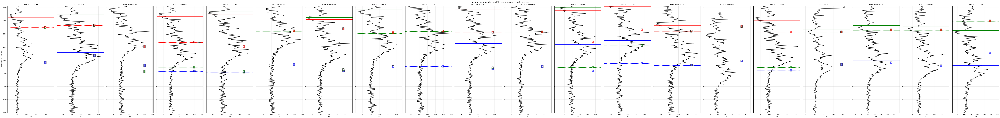

In [107]:
selected_wells = well_list[:20]  # Sélectionner 5 puits pour la visualisation
fig2 = display_multiple_wells(selected_wells, df_log_100, df_tops_100, df_preds, start_depth=6000)
plt.show()

In [108]:
def display_enhanced_well_analysis(well_ids, df_log, df_tops_real, df_preds, model, input_variable, 
                                  start_depth=6000, end_depth=6800, max_wells=4, figsize=(20, 15), device=device):
    """
    Enhanced visualization with two panels per well showing:
    1. GR curve with markers
    2. Probability curves by depth (using class numbers)
    
    Modified to ensure consistent depth scale between left and right plots.
    """
    # Limit the number of wells
    well_ids = well_ids[:max_wells]
    n_wells = len(well_ids)
    
    if n_wells == 0:
        print("No wells provided")
        return None
    
    # Create a figure with more space for margins
    fig = plt.figure(figsize=figsize)
    
    # Create a grid of subplots (n_wells rows, 2 columns)
    # Adjust subplot parameters for better spacing
    gs = fig.add_gridspec(n_wells, 2, hspace=0.3, wspace=0.2)
    axes = []
    for i in range(n_wells):
        row_axes = []
        for j in range(2):
            row_axes.append(fig.add_subplot(gs[i, j]))
        axes.append(row_axes)
    
    # Define class colors and labels
    class_colors = ['blue', 'green', 'red', 'purple']
    class_labels = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
    
    # Define marker colors
    marker_colors = {'NIOBARA': 'blue', 'FORT_HAYS': 'green', 'CODELL': 'red'}
    marker_names = list(marker_colors.keys())
    
    # Process each well
    for i, well_id in enumerate(well_ids):
        ax1, ax2 = axes[i]
        
        # Get well data
        if 'wellName' in df_log.columns:
            df_well = df_log[df_log['wellName'] == well_id]
        else:
            try:
                df_well = df_log[df_log.index == well_id]
            except:
                ax1.text(0.5, 0.5, f"Could not find well {well_id}", ha='center')
                continue
        
        if df_well.empty:
            ax1.text(0.5, 0.5, f"No data for well {well_id}", ha='center')
            continue
        
        # Determine depth column
        depth_column = None
        for col_option in ['Depth', 'DEPTH', 'depth', 'MD', 'md']:
            if col_option in df_well.columns:
                depth_column = col_option
                break
        
        if depth_column is None:
            ax1.text(0.5, 0.5, f"No depth column for well {well_id}", ha='center')
            continue
        
        # Filter by start_depth
        df_well = df_well[df_well[depth_column] >= start_depth]
        
        if df_well.empty:
            ax1.text(0.5, 0.5, f"No data for well {well_id} from depth {start_depth}", ha='center')
            continue
        
        # Get well-specific end depth (use provided end_depth or max from data)
        well_end_depth = min(end_depth, df_well[depth_column].max()) if end_depth else df_well[depth_column].max()
        
        # Filter by end_depth if specified
        if end_depth:
            df_well = df_well[df_well[depth_column] <= well_end_depth]
        
        # Prepare data for model
        df_wgr = Well_grlog_cleaning(well_id, df_log, input_variable)
        df_wgr = df_wgr[df_wgr['Depth'] >= start_depth]
        
        if end_depth:
            df_wgr = df_wgr[df_wgr['Depth'] <= well_end_depth]
        
        if df_wgr.empty:
            ax1.text(0.5, 0.5, f"No cleaned data for well {well_id}", ha='center')
            continue
        
        # Get model predictions with probabilities
        try:
            # Create a graph directly from the features
            features = torch.tensor(df_wgr.values, dtype=torch.float32)
            depths = df_wgr['Depth'].values
            gr_values = df_wgr['GR'].values
            
            # Create an empty graph with the right number of nodes
            num_nodes = len(df_wgr)
            g = dgl.graph(([], []), num_nodes=num_nodes)
            
            # Add node features
            g.ndata['features'] = features
            
            # Add self-loops
            g = dgl.add_self_loop(g)
            g = g.to(device)
            
            # Run model inference
            model.eval()
            with torch.no_grad():
                logits = model(g, g.ndata['features'])
                probabilities = F.softmax(logits, dim=1).cpu().numpy()
        except Exception as e:
            ax1.text(0.5, 0.5, f"Error processing well {well_id}: {str(e)}", ha='center')
            continue
        
        # First plot: GR curve with markers
        ax1.plot(df_well['GR'], df_well[depth_column], 'k-', linewidth=1.5, label='GR')
        
        # Markers réels
        if well_id in df_tops_real.index:
            for marker in marker_names:
                if marker in df_tops_real.columns and not pd.isna(df_tops_real.loc[well_id, marker]):
                    depth = df_tops_real.loc[well_id, marker]
                    # Only show marker if it's within the depth range
                    if start_depth <= depth <= well_end_depth:
                        ax1.axhline(y=depth, color=marker_colors[marker], linestyle='-', linewidth=2)
                        # Use first letter as label
                        ax1.text(ax1.get_xlim()[1]*0.85, depth, marker[0],
                                bbox=dict(facecolor=marker_colors[marker], alpha=0.7), color='white', fontweight='bold')
        
        # Marqueurs prédits
        if well_id in df_preds.index:
            for marker in marker_names:
                if marker in df_preds.columns and not pd.isna(df_preds.loc[well_id, marker]):
                    depth = df_preds.loc[well_id, marker]
                    # Only show marker if it's within the depth range
                    if start_depth <= depth <= well_end_depth:
                        ax1.axhline(y=depth, color=marker_colors[marker], linestyle='--', linewidth=2)
                        # Use first letter as label
                        ax1.text(ax1.get_xlim()[0]*1.5, depth, marker[0],
                                bbox=dict(facecolor=marker_colors[marker], alpha=0.7), color='white', fontweight='bold')
        
        # Second plot: Probability curves vs depth
        for j in range(probabilities.shape[1]):
            ax2.plot(probabilities[:, j], depths, label=class_labels[j], color=class_colors[j], linewidth=2)
        
        # Add vertical line at 0.5 probability
        ax2.axvline(x=0.5, color='black', linestyle='--', alpha=0.3)
        
        # Set titles and labels
        ax1.set_title(f'Well {well_id} - GR', fontsize=14)
        ax2.set_title('Classification Probabilities', fontsize=14)
        
        # Only add legend to first row
        if i == 0:
            ax2.legend(loc='upper right', fontsize=12)
        
        # Set y-axis limits - NOW WITH CORRECT ORIENTATION
        ax1.set_ylim(well_end_depth, start_depth)  # Inverted to have depth increasing downward
        ax2.set_ylim(well_end_depth, start_depth)  # Same for probability plot
        
        # Set identical y-ticks for both plots to ensure identical scaling
        y_ticks = np.linspace(start_depth, well_end_depth, 9)  # 9 tick marks
        ax1.set_yticks(y_ticks)
        ax2.set_yticks(y_ticks)
        
        # Add grid
        ax1.grid(True, alpha=0.3)
        ax2.grid(True, alpha=0.3)
        
        # Set x-axis limits
        ax2.set_xlim(0, 1)
        
        # Only add x-labels to bottom row
        if i == n_wells - 1:
            ax1.set_xlabel('GR', fontsize=12)
            ax2.set_xlabel('Probability', fontsize=12)
        
        # Add y-label only to leftmost plots
        ax1.set_ylabel(f'Depth (m)', fontsize=12)
        
        # Make sure both plots have identical y-axis limits and scales
        ax2.set_ylim(ax1.get_ylim())
    
    # Add a main title with proper spacing
    plt.suptitle('Well Analysis with Classification Probabilities', fontsize=18, y=0.98)
    
    # Use subplot adjustments instead of tight_layout
    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.08, right=0.92, hspace=0.35, wspace=0.25)
    
    return fig

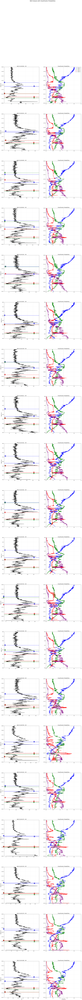

In [109]:
# For multiple wells with proper depth range
fig = display_enhanced_well_analysis(
    well_ids=selected_wells,
    df_log=df_log_100,
    df_tops_real=df_tops_100,
    df_preds=df_preds,
    model=model,
    input_variable=['GR', 'Depth', 'Latitude', 'Longitude'],
    start_depth=6000,
    end_depth=7000,  # Set your desired end depth
    max_wells=20,
    figsize=(20, 240),
    device=device
)
plt.show()

## NEW METHOD USING PROBABILITY CURVE

In [110]:
def extract_marker_depths_general(model, batch, depth_array, gr_values=None):
    """
    Extract marker depths based on specific criteria.
    Fixed to properly align depth indices with probability indices.
    """
    batch = dgl.add_self_loop(batch)
    depth_array = np.array(depth_array)
    
    # get probs
    model.eval()
    with torch.no_grad():
        logits = model(batch, batch.ndata['features'])
        probabilities = F.softmax(logits, dim=1).cpu().numpy()
    
    #print shape for debug (arrays aren't necessarily matching)
    print(f"Probability shape: {probabilities.shape}")
    print(f"Depth array shape: {depth_array.shape}")
    
    # Ensure arrays are the same length (they should be!)
    assert len(probabilities) == len(depth_array), f"Mismatch: {len(probabilities)} vs {len(depth_array)}"
    
    # prob curves
    num_classes = probabilities.shape[1]
    print(f"Number of classes: {num_classes}")
    
    # class 1 and class 2 curves 
    class_1_probs = probabilities[:, 1] if num_classes > 1 else np.zeros(len(probabilities))  # GREEN
    class_2_probs = probabilities[:, 2] if num_classes > 2 else np.zeros(len(probabilities))  # RED
    
    # First index
    niobara_idx = np.argmax(class_1_probs)
    niobara_depth = depth_array[niobara_idx]
    
    # 2nd index
    codell_idx = np.argmax(class_2_probs)
    codell_depth = depth_array[codell_idx]
    
    # Threshold set up
    search_start_idx = codell_idx + 1
    if search_start_idx < len(depth_array):
        below_threshold_indices = np.where(class_2_probs[search_start_idx:] < 0.2)[0]
        
        if len(below_threshold_indices) > 0:
            fort_hays_idx = search_start_idx + below_threshold_indices[0]
        else:
            #no threshold case 
            remaining_probs = class_2_probs[search_start_idx:]
            if len(remaining_probs) > 0:
                fort_hays_idx = search_start_idx + np.argmin(remaining_probs)
            else:
                fort_hays_idx = len(depth_array) - 1
    else:
        fort_hays_idx = len(depth_array) - 1
    
    fort_hays_depth = depth_array[fort_hays_idx]
    
    # Debug print in case
    print(f"NIOBARA: depth={niobara_depth}, prob={class_1_probs[niobara_idx]:.3f}")
    print(f"CODELL: depth={codell_depth}, prob={class_2_probs[codell_idx]:.3f}")
    print(f"FORT_HAYS: depth={fort_hays_depth}")
    
    
    return (niobara_depth, fort_hays_depth, codell_depth)

In [111]:
well_list = df_log_100['wellName'].unique().astype(int)
well_list = set(list(df_tops_100.index)).intersection(set(well_list))
well_list = list(well_list)

num_well = min(100, len(well_list)) 
df_preds = pd.DataFrame(columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])
new_data = []

for index in range(num_well):
    try:
        # generate the depth and labels of corresponding well
        well = well_list[index]
        
        # Create cleaned dataframe
        df_wgr = Well_grlog_cleaning(well, df_log_100, input_variable)
        df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
        
        if df_wgr.empty:
            print(f"Skipping well {well}: no data after cleaning")
            continue
        
        # Get depths directly from the cleaned dataframe
        depth_array = df_wgr['Depth'].values
        
        # Create graph directly from df_wgr
        features = torch.tensor(df_wgr.values, dtype=torch.float32)
        num_nodes = len(df_wgr)
        
        # Create a DGL graph with the correct number of nodes
        graph = dgl.graph(([], []), num_nodes=num_nodes)
        graph.ndata['features'] = features
        
        # Add self-loops
        graph = dgl.add_self_loop(graph)
        
        if torch.cuda.is_available():
            graph = graph.to(device)
        
        # Get predictions
        model.eval()
        with torch.no_grad():
            # pred function
            niobara_depth, fort_hays_depth, codell_depth = extract_marker_depths_general(
                model, graph, depth_array
            )
        
        new_data.append([well, niobara_depth, fort_hays_depth, codell_depth])
        
    except Exception as e:
        print(f"Error processing well {well}: {str(e)}")
        continue

df_preds = pd.DataFrame(new_data, columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])

# Process results
df_tops_100.reset_index(inplace=True)
df_tops_valide = df_tops_100[df_tops_100['wellName'].isin(well_list[:100])] 
df_tops_valide.sort_values(by=['wellName'], inplace=True)
df_tops_valide.set_index('wellName', inplace=True)
df_tops_100.set_index('wellName', inplace=True)
df_preds.set_index('wellName', inplace=True)
df_preds = df_preds.sort_index()

recall, mae, df_res = recall_tops(df_tops_valide, df_preds, tolerance=20)
print("recall {0}, mae {1}".format(recall, mae))
df_res

Probability shape: (876, 4)
Depth array shape: (876,)
Number of classes: 4
NIOBARA: depth=6405, prob=0.535
CODELL: depth=6735, prob=0.561
FORT_HAYS: depth=6751
Probability shape: (907, 4)
Depth array shape: (907,)
Number of classes: 4
NIOBARA: depth=6410, prob=0.534
CODELL: depth=6731, prob=0.500
FORT_HAYS: depth=6743
Probability shape: (958, 4)
Depth array shape: (958,)
Number of classes: 4
NIOBARA: depth=6474, prob=0.517
CODELL: depth=6781, prob=0.559
FORT_HAYS: depth=6797
Probability shape: (916, 4)
Depth array shape: (916,)
Number of classes: 4
NIOBARA: depth=6406, prob=0.534
CODELL: depth=6741, prob=0.589
FORT_HAYS: depth=6757
Probability shape: (967, 4)
Depth array shape: (967,)
Number of classes: 4
NIOBARA: depth=6421, prob=0.530
CODELL: depth=6758, prob=0.522
FORT_HAYS: depth=6765
Probability shape: (1042, 4)
Depth array shape: (1042,)
Number of classes: 4
NIOBARA: depth=6491, prob=0.494
CODELL: depth=6852, prob=0.612
FORT_HAYS: depth=6868
Probability shape: (906, 4)
Depth arra

,NIOBARA,FORT_HAYS,CODELL,NIOBARA_pred,FORT_HAYS_pred,CODELL_pred,NIOBARA_ae,NIOBARA_tp,FORT_HAYS_ae,FORT_HAYS_tp,CODELL_ae,CODELL_tp
wellName,,,,,,,,,,,,
512320966,6536.5,6824.0,6789.0,6435,6807,6797,101.5,False,17.0,True,8.0,True
512320967,6510.0,6781.0,6756.0,6420,6781,6765,90.0,False,0.0,True,9.0,True
512320981,6450.0,6714.0,6690.0,6425,6714,6698,25.0,False,0.0,True,8.0,True
512320982,6490.0,6766.0,6742.0,6414,6976,6976,76.0,False,210.0,False,234.0,False
512322244,6314.0,6580.0,6555.0,6380,6663,6562,66.0,False,83.0,False,7.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...
512330517,6251.0,6508.0,6484.0,6427,6639,6505,176.0,False,131.0,False,21.0,False
512330518,6224.0,6478.0,6454.0,6425,6641,6462,201.0,False,163.0,False,8.0,True
512330519,6236.0,6494.0,6471.0,6420,6638,6478,184.0,False,144.0,False,7.0,True


In [112]:
n = df_res['NIOBARA_ae'].mean()
f = df_res['FORT_HAYS_ae'].mean()
c = df_res['CODELL_ae'].mean()
n1 = df_res['NIOBARA_pred'].mean()
f1 = df_res['FORT_HAYS_pred'].mean()
c1 = df_res['CODELL_pred'].mean()
n2 = df_res['NIOBARA'].mean()
f2 = df_res['FORT_HAYS'].mean()
c2 = df_res['CODELL'].mean()
n3 = df_res['NIOBARA_ae'].std()
f3 = df_res['FORT_HAYS_ae'].std()
c3 = df_res['CODELL_ae'].std()

print(f"NIOBARA_ae mean: {n:.3f}")
print(f"FORT_HAYS_ae mean: {f:.3f}")
print(f"CODELL_ae mean: {c:.3f}")

print(f"NIOBARA_pred mean: {n1:.3f}")
print(f"FORT_HAYS_pred mean: {f1:.3f}")
print(f"CODELL_pred mean: {c1:.3f}")

print(f"NIOBARA mean: {n2:.3f}")
print(f"FORT_HAYS mean: {f2:.3f}")
print(f"CODELL mean: {c2:.3f}")

print(f"NIOBARA_ae std: {n3:.3f}")
print(f"FORT_HAYS_ae std: {f3:.3f}")
print(f"CODELL_ae std: {c3:.3f}")

recall = df_res[['NIOBARA_tp','FORT_HAYS_tp','CODELL_tp']].mean()
print(recall)

NIOBARA_ae mean: 78.650
FORT_HAYS_ae mean: 41.240
CODELL_ae mean: 32.380
NIOBARA_pred mean: 6436.880
FORT_HAYS_pred mean: 6757.650
CODELL_pred mean: 6727.050
NIOBARA mean: 6458.620
FORT_HAYS mean: 6729.130
CODELL mean: 6704.790
NIOBARA_ae std: 36.800
FORT_HAYS_ae std: 77.031
CODELL_ae std: 73.346
NIOBARA_tp      0.02
FORT_HAYS_tp    0.71
CODELL_tp       0.81
dtype: float64


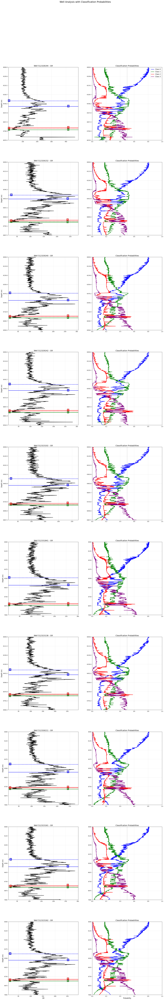

In [113]:
selected_wells = well_list[:20]

fig = display_enhanced_well_analysis(
    well_ids=selected_wells,
    df_log=df_log_100,
    df_tops_real=df_tops_100,
    df_preds=df_preds,
    model=model,
    input_variable=['GR', 'Depth', 'Latitude', 'Longitude'],
    start_depth=6000,
    end_depth=7000, 
    max_wells=10,
    figsize=(20, 120),
    device=device
)
fig.savefig('well_analysis.png',    
            dpi=300,                
            bbox_inches='tight'     
           )
plt.show()

In [114]:
well_list = df_log_50['wellName'].unique().astype(int)
well_list = set(list(df_tops_50.index)).intersection(set(well_list))
well_list = list(well_list)

# generate df preds
num_well = min(50, len(well_list)) 
df_preds = pd.DataFrame(columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])
new_data = []

for index in range(num_well):
    try:
        well = well_list[index]
       
        df_wgr = Well_grlog_cleaning(well, df_log_50, input_variable)
        df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
        
        if df_wgr.empty:
            print(f"Skipping well {well}: no data after cleaning")
            continue
        
        depth_array = df_wgr['Depth'].values

        features = torch.tensor(df_wgr.values, dtype=torch.float32)
        num_nodes = len(df_wgr)
        
        graph = dgl.graph(([], []), num_nodes=num_nodes)
        graph.ndata['features'] = features
        
       
        graph = dgl.add_self_loop(graph)
        
        if torch.cuda.is_available():
            graph = graph.to(device)
        
        
        model.eval()
        with torch.no_grad():
            
            niobara_depth, fort_hays_depth, codell_depth = extract_marker_depths_general(
                model, graph, depth_array
            )
        
        new_data.append([well, niobara_depth, fort_hays_depth, codell_depth])
        
    except Exception as e:
        print(f"Error processing well {well}: {str(e)}")
        continue

df_preds = pd.DataFrame(new_data, columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])

# Process results
df_tops_50.reset_index(inplace=True)
df_tops_valide = df_tops_50[df_tops_50['wellName'].isin(well_list[:50])] 
df_tops_valide.sort_values(by=['wellName'], inplace=True)
df_tops_valide.set_index('wellName', inplace=True)
df_tops_50.set_index('wellName', inplace=True)
df_preds.set_index('wellName', inplace=True)
df_preds = df_preds.sort_index()

recall, mae, df_res = recall_tops(df_tops_valide, df_preds, tolerance=20)
print(f"recall {recall}, mae {mae}")
df_res

Probability shape: (906, 4)
Depth array shape: (906,)
Number of classes: 4
NIOBARA: depth=6406, prob=0.535
CODELL: depth=6712, prob=0.601
FORT_HAYS: depth=6728
Probability shape: (887, 4)
Depth array shape: (887,)
Number of classes: 4
NIOBARA: depth=6404, prob=0.533
CODELL: depth=6677, prob=0.611
FORT_HAYS: depth=6693
Probability shape: (962, 4)
Depth array shape: (962,)
Number of classes: 4
NIOBARA: depth=6431, prob=0.531
CODELL: depth=6791, prob=0.582
FORT_HAYS: depth=6804
Probability shape: (688, 4)
Depth array shape: (688,)
Number of classes: 4
NIOBARA: depth=6411, prob=0.529
CODELL: depth=6526, prob=0.827
FORT_HAYS: depth=6647
Probability shape: (750, 4)
Depth array shape: (750,)
Number of classes: 4
NIOBARA: depth=6392, prob=0.524
CODELL: depth=6662, prob=0.745
FORT_HAYS: depth=6664
Probability shape: (878, 4)
Depth array shape: (878,)
Number of classes: 4
NIOBARA: depth=6417, prob=0.529
CODELL: depth=6641, prob=0.685
FORT_HAYS: depth=6659
Probability shape: (914, 4)
Depth array 

,NIOBARA,FORT_HAYS,CODELL,NIOBARA_pred,FORT_HAYS_pred,CODELL_pred,NIOBARA_ae,NIOBARA_tp,FORT_HAYS_ae,FORT_HAYS_tp,CODELL_ae,CODELL_tp
wellName,,,,,,,,,,,,
512320936,6514.0,6791.0,6765.0,6425,6790,6774,89.0,False,1.0,True,9.0,True
512320968,6539.0,6814.0,6788.0,6435,6807,6797,104.0,False,7.0,True,9.0,True
512320984,6471.0,6740.0,6717.0,6405,6741,6725,66.0,False,1.0,True,8.0,True
512322242,6370.0,6608.0,6582.0,6415,6805,6804,45.0,False,197.0,False,222.0,False
512322535,6460.0,6620.0,6592.0,6399,6640,6602,61.0,False,20.0,True,10.0,True
512322732,6567.5,6851.0,6827.0,6490,6851,6835,77.5,False,0.0,True,8.0,True
512322775,6460.0,6743.0,6718.0,6407,6742,6730,53.0,False,1.0,True,12.0,True
512322788,6371.0,6637.0,6612.0,6412,6649,6621,41.0,False,12.0,True,9.0,True
512322802,6560.0,6746.0,6720.0,6462,6746,6728,98.0,False,0.0,True,8.0,True


In [115]:
n = df_res['NIOBARA_ae'].mean()
f = df_res['FORT_HAYS_ae'].mean()
c = df_res['CODELL_ae'].mean()
n1 = df_res['NIOBARA_pred'].mean()
f1 = df_res['FORT_HAYS_pred'].mean()
c1 = df_res['CODELL_pred'].mean()
n2 = df_res['NIOBARA'].mean()
f2 = df_res['FORT_HAYS'].mean()
c2 = df_res['CODELL'].mean()
n3 = df_res['NIOBARA_ae'].std()
f3 = df_res['FORT_HAYS_ae'].std()
c3 = df_res['CODELL_ae'].std()

print(f"NIOBARA_ae mean: {n:.3f}")
print(f"FORT_HAYS_ae mean: {f:.3f}")
print(f"CODELL_ae mean: {c:.3f}")

print(f"NIOBARA_pred mean: {n1:.3f}")
print(f"FORT_HAYS_pred mean: {f1:.3f}")
print(f"CODELL_pred mean: {c1:.3f}")

print(f"NIOBARA mean: {n2:.3f}")
print(f"FORT_HAYS mean: {f2:.3f}")
print(f"CODELL mean: {c2:.3f}")

print(f"NIOBARA_ae std: {n3:.3f}")
print(f"FORT_HAYS_ae std: {f3:.3f}")
print(f"CODELL_ae std: {c3:.3f}")

recall = df_res[['NIOBARA_tp','FORT_HAYS_tp','CODELL_tp']].mean()
print(recall)

NIOBARA_ae mean: 78.210
FORT_HAYS_ae mean: 34.900
CODELL_ae mean: 26.360
NIOBARA_pred mean: 6435.900
FORT_HAYS_pred mean: 6757.420
CODELL_pred mean: 6726.020
NIOBARA mean: 6455.410
FORT_HAYS mean: 6724.240
CODELL mean: 6700.140
NIOBARA_ae std: 35.617
FORT_HAYS_ae std: 58.713
CODELL_ae std: 54.909
NIOBARA_tp      0.02
FORT_HAYS_tp    0.74
CODELL_tp       0.86
dtype: float64


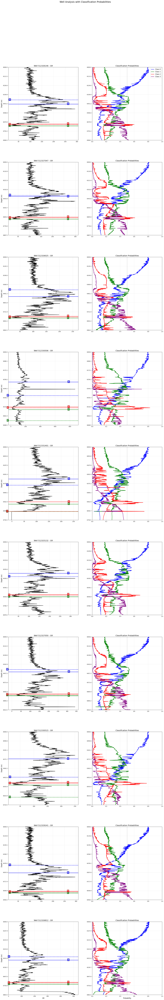

In [116]:
selected_wells = well_list[:20]

fig = display_enhanced_well_analysis(
    well_ids=selected_wells,
    df_log=df_log_50,
    df_tops_real=df_tops_50,
    df_preds=df_preds,
    model=model,
    input_variable=['GR', 'Depth', 'Latitude', 'Longitude'],
    start_depth=6000,
    end_depth=7000,  # Set your desired end depth
    max_wells=10,
    figsize=(20, 120),
    device=device
)
fig.savefig('well_analysis.png',    # filename (you can include a full path)
            dpi=300,                # resolution in dots per inch
            bbox_inches='tight'     # trim extra whitespace
           )
plt.show()

In [117]:
def extract_marker_depths_general(model, batch, depth_array, threshold=0.4, smoothing_window=5, sharpness_threshold=1.5):
    import torch.nn.functional as F
    import dgl
    from scipy.ndimage import uniform_filter1d
    
    # Ensure the batch has self-loops for message passing
    batch = dgl.add_self_loop(batch)
    depth_array = np.array(depth_array)
    
    # Get probabilities from model
    model.eval()
    with torch.no_grad():
        logits = model(batch, batch.ndata['features'])
        probabilities = F.softmax(logits, dim=1).cpu().numpy()
    
    # Debug info
    print(f"Probability shape: {probabilities.shape}")
    print(f"Depth array shape: {depth_array.shape}")
    
    # Ensure arrays are the same length
    assert len(probabilities) == len(depth_array), f"Mismatch: {len(probabilities)} vs {len(depth_array)}"
    
    num_classes = probabilities.shape[1]
    print(f"Number of classes: {num_classes}")
    
    class_1_probs = probabilities[:, 1] if num_classes > 1 else np.zeros(len(probabilities))  # NIOBARA
    class_2_probs = probabilities[:, 2] if num_classes > 2 else np.zeros(len(probabilities))  # CODELL
    
    # Apply smoothing ONLY to class 1 
    smoothed_class_1 = uniform_filter1d(class_1_probs, size=smoothing_window)
    
    #max probability point
    max_prob_idx = np.argmax(smoothed_class_1)
    max_prob_value = smoothed_class_1[max_prob_idx]
    
    #points above threshold
    above_threshold = smoothed_class_1 > threshold
    
    # Initialize variables
    niobara_idx = max_prob_idx  # Default to max
    curve_shape = "sharp"  # Default
    
    if np.any(above_threshold):
        indices_above_threshold = np.where(above_threshold)[0]
        last_index = indices_above_threshold[-1]
        
        if len(indices_above_threshold) > 1:
            #avg ratio
            avg_prob = np.mean(smoothed_class_1[indices_above_threshold])
            
            #cruve sharpness
            sharpness = max_prob_value / avg_prob
            
            if sharpness > sharpness_threshold:
                #curve sharp -> Max Points
                curve_shape = "sharp"
                niobara_idx = max_prob_idx
            else:
                #Use a mean point if not sharp
                curve_shape = "flat"
                niobara_idx = int((max_prob_idx + last_index) / 2)
    
    niobara_depth = depth_array[niobara_idx]
    
    # Curve2 max
    codell_idx = np.argmax(class_2_probs)
    codell_depth = depth_array[codell_idx]
    
    #Threshold system
    search_start_idx = codell_idx + 1
    if search_start_idx < len(depth_array):
        below_threshold_indices = np.where(class_2_probs[search_start_idx:] < 0.25)[0]
        
        if len(below_threshold_indices) > 0:
            fort_hays_idx = search_start_idx + below_threshold_indices[0]
        else:
            #In case of no threshold
            remaining_probs = class_2_probs[search_start_idx:]
            if len(remaining_probs) > 0:
                fort_hays_idx = search_start_idx + np.argmin(remaining_probs)
            else:
                fort_hays_idx = len(depth_array) - 1
    else:
        fort_hays_idx = len(depth_array) - 1
    
    fort_hays_depth = depth_array[fort_hays_idx]
    
    # Debug information
    print(f"NIOBARA: depth={niobara_depth}, curve={curve_shape}, sharpness={sharpness if 'sharpness' in locals() else 'N/A'}")
    print(f"CODELL: depth={codell_depth}, prob={class_2_probs[codell_idx]:.3f}")
    print(f"FORT_HAYS: depth={fort_hays_depth}")
    
    return (niobara_depth, fort_hays_depth, codell_depth)

In [118]:
well_list = df_log_100['wellName'].unique().astype(int)
well_list = set(list(df_tops_100.index)).intersection(set(well_list))
well_list = list(well_list)

num_well = min(100, len(well_list)) 
df_preds = pd.DataFrame(columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])
new_data = []

for index in range(num_well):
    try:
        # generate the depth and labels of corresponding well
        well = well_list[index]
        
        # Create cleaned dataframe
        df_wgr = Well_grlog_cleaning(well, df_log_100, input_variable)
        df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
        
        if df_wgr.empty:
            print(f"Skipping well {well}: no data after cleaning")
            continue
        
        # Get depths directly from the cleaned dataframe
        depth_array = df_wgr['Depth'].values
        
        # Create graph directly from df_wgr
        features = torch.tensor(df_wgr.values, dtype=torch.float32)
        num_nodes = len(df_wgr)
        
        # Create a DGL graph with the correct number of nodes
        graph = dgl.graph(([], []), num_nodes=num_nodes)
        graph.ndata['features'] = features
        
        # Add self-loops
        graph = dgl.add_self_loop(graph)
        
        if torch.cuda.is_available():
            graph = graph.to(device)
        
        # Get predictions
        model.eval()
        with torch.no_grad():
            # pred function
            niobara_depth, fort_hays_depth, codell_depth = extract_marker_depths_general(
                model, graph, depth_array
            )
        
        new_data.append([well, niobara_depth, fort_hays_depth, codell_depth])
        
    except Exception as e:
        print(f"Error processing well {well}: {str(e)}")
        continue

df_preds = pd.DataFrame(new_data, columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])

# Process results
df_tops_100.reset_index(inplace=True)
df_tops_valide = df_tops_100[df_tops_100['wellName'].isin(well_list[:100])] 
df_tops_valide.sort_values(by=['wellName'], inplace=True)
df_tops_valide.set_index('wellName', inplace=True)
df_tops_100.set_index('wellName', inplace=True)
df_preds.set_index('wellName', inplace=True)
df_preds = df_preds.sort_index()

recall, mae, df_res = recall_tops(df_tops_valide, df_preds, tolerance=20)
print("recall {0}, mae {1}".format(recall, mae))
df_res

Probability shape: (876, 4)
Depth array shape: (876,)
Number of classes: 4
NIOBARA: depth=6482, curve=flat, sharpness=1.1090703010559082
CODELL: depth=6735, prob=0.561
FORT_HAYS: depth=6745
Probability shape: (907, 4)
Depth array shape: (907,)
Number of classes: 4
NIOBARA: depth=6465, curve=flat, sharpness=1.0859626531600952
CODELL: depth=6731, prob=0.500
FORT_HAYS: depth=6743
Probability shape: (958, 4)
Depth array shape: (958,)
Number of classes: 4
NIOBARA: depth=6547, curve=flat, sharpness=1.1535017490386963
CODELL: depth=6781, prob=0.559
FORT_HAYS: depth=6792
Probability shape: (916, 4)
Depth array shape: (916,)
Number of classes: 4
NIOBARA: depth=6474, curve=flat, sharpness=1.1002802848815918
CODELL: depth=6741, prob=0.589
FORT_HAYS: depth=6757
Probability shape: (967, 4)
Depth array shape: (967,)
Number of classes: 4
NIOBARA: depth=6488, curve=flat, sharpness=1.098961353302002
CODELL: depth=6758, prob=0.522
FORT_HAYS: depth=6765
Probability shape: (1042, 4)
Depth array shape: (10

,NIOBARA,FORT_HAYS,CODELL,NIOBARA_pred,FORT_HAYS_pred,CODELL_pred,NIOBARA_ae,NIOBARA_tp,FORT_HAYS_ae,FORT_HAYS_tp,CODELL_ae,CODELL_tp
wellName,,,,,,,,,,,,
512320966,6536.5,6824.0,6789.0,6518,6807,6797,18.5,True,17.0,True,8.0,True
512320967,6510.0,6781.0,6756.0,6502,6775,6765,8.0,True,6.0,True,9.0,True
512320981,6450.0,6714.0,6690.0,6467,6714,6698,17.0,True,0.0,True,8.0,True
512320982,6490.0,6766.0,6742.0,6482,6976,6976,8.0,True,210.0,False,234.0,False
512322244,6314.0,6580.0,6555.0,6414,6588,6562,100.0,False,8.0,True,7.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...
512330517,6251.0,6508.0,6484.0,6459,6592,6505,208.0,False,84.0,False,21.0,False
512330518,6224.0,6478.0,6454.0,6427,6494,6462,203.0,False,16.0,True,8.0,True
512330519,6236.0,6494.0,6471.0,6432,6598,6478,196.0,False,104.0,False,7.0,True


In [119]:
n = df_res['NIOBARA_ae'].mean()
f = df_res['FORT_HAYS_ae'].mean()
c = df_res['CODELL_ae'].mean()
n1 = df_res['NIOBARA_pred'].mean()
f1 = df_res['FORT_HAYS_pred'].mean()
c1 = df_res['CODELL_pred'].mean()
n2 = df_res['NIOBARA'].mean()
f2 = df_res['FORT_HAYS'].mean()
c2 = df_res['CODELL'].mean()
n3 = df_res['NIOBARA_ae'].std()
f3 = df_res['FORT_HAYS_ae'].std()
c3 = df_res['CODELL_ae'].std()

print(f"NIOBARA_ae mean: {n:.3f}")
print(f"FORT_HAYS_ae mean: {f:.3f}")
print(f"CODELL_ae mean: {c:.3f}")

print(f"NIOBARA_pred mean: {n1:.3f}")
print(f"FORT_HAYS_pred mean: {f1:.3f}")
print(f"CODELL_pred mean: {c1:.3f}")

print(f"NIOBARA mean: {n2:.3f}")
print(f"FORT_HAYS mean: {f2:.3f}")
print(f"CODELL mean: {c2:.3f}")

print(f"NIOBARA_ae std: {n3:.3f}")
print(f"FORT_HAYS_ae std: {f3:.3f}")
print(f"CODELL_ae std: {c3:.3f}")

recall = df_res[['NIOBARA_tp','FORT_HAYS_tp','CODELL_tp']].mean()
print(recall)

NIOBARA_ae mean: 53.090
FORT_HAYS_ae mean: 29.360
CODELL_ae mean: 32.380
NIOBARA_pred mean: 6492.050
FORT_HAYS_pred mean: 6742.610
CODELL_pred mean: 6727.050
NIOBARA mean: 6458.620
FORT_HAYS mean: 6729.130
CODELL mean: 6704.790
NIOBARA_ae std: 58.799
FORT_HAYS_ae std: 71.796
CODELL_ae std: 73.346
NIOBARA_tp      0.46
FORT_HAYS_tp    0.85
CODELL_tp       0.81
dtype: float64


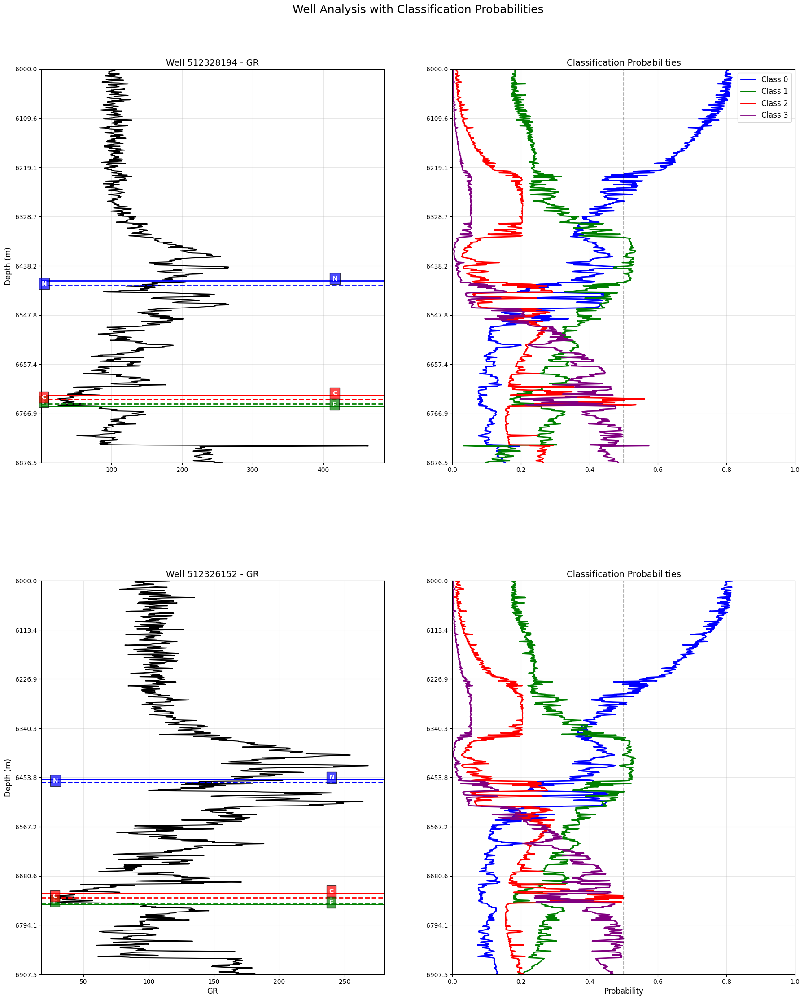

In [120]:
selected_wells = well_list[:20]

fig = display_enhanced_well_analysis(
    well_ids=selected_wells,
    df_log=df_log_100,
    df_tops_real=df_tops_100,
    df_preds=df_preds,
    model=model,
    input_variable=['GR', 'Depth', 'Latitude', 'Longitude'],
    start_depth=6000,
    end_depth=7000, 
    max_wells=2,
    figsize=(20, 24),
    device=device
)
fig.savefig('well_analysis.png',    
            dpi=300,                
            bbox_inches='tight'     
           )
plt.show()

In [121]:
well_list = df_log_50['wellName'].unique().astype(int)
well_list = set(list(df_tops_50.index)).intersection(set(well_list))
well_list = list(well_list)

# generate df preds
num_well = min(50, len(well_list)) 
df_preds = pd.DataFrame(columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])
new_data = []

for index in range(num_well):
    try:
        well = well_list[index]
       
        df_wgr = Well_grlog_cleaning(well, df_log_50, input_variable)
        df_wgr = df_wgr[df_wgr['Depth'] > start_depth]
        
        if df_wgr.empty:
            print(f"Skipping well {well}: no data after cleaning")
            continue
        
        depth_array = df_wgr['Depth'].values

        features = torch.tensor(df_wgr.values, dtype=torch.float32)
        num_nodes = len(df_wgr)
        
        graph = dgl.graph(([], []), num_nodes=num_nodes)
        graph.ndata['features'] = features
        
       
        graph = dgl.add_self_loop(graph)
        
        if torch.cuda.is_available():
            graph = graph.to(device)
        
        
        model.eval()
        with torch.no_grad():
            
            niobara_depth, fort_hays_depth, codell_depth = extract_marker_depths_general(
                model, graph, depth_array
            )
        
        new_data.append([well, niobara_depth, fort_hays_depth, codell_depth])
        
    except Exception as e:
        print(f"Error processing well {well}: {str(e)}")
        continue

df_preds = pd.DataFrame(new_data, columns=['wellName', "NIOBARA", "FORT_HAYS", "CODELL"])

# Process results
df_tops_50.reset_index(inplace=True)
df_tops_valide = df_tops_50[df_tops_50['wellName'].isin(well_list[:50])] 
df_tops_valide.sort_values(by=['wellName'], inplace=True)
df_tops_valide.set_index('wellName', inplace=True)
df_tops_50.set_index('wellName', inplace=True)
df_preds.set_index('wellName', inplace=True)
df_preds = df_preds.sort_index()

recall, mae, df_res = recall_tops(df_tops_valide, df_preds, tolerance=20)
print(f"recall {recall}, mae {mae}")
df_res

Probability shape: (906, 4)
Depth array shape: (906,)
Number of classes: 4
NIOBARA: depth=6470, curve=flat, sharpness=1.0912460088729858
CODELL: depth=6712, prob=0.601
FORT_HAYS: depth=6728
Probability shape: (887, 4)
Depth array shape: (887,)
Number of classes: 4
NIOBARA: depth=6461, curve=flat, sharpness=1.0975629091262817
CODELL: depth=6677, prob=0.611
FORT_HAYS: depth=6693
Probability shape: (962, 4)
Depth array shape: (962,)
Number of classes: 4
NIOBARA: depth=6511, curve=flat, sharpness=1.123051643371582
CODELL: depth=6791, prob=0.582
FORT_HAYS: depth=6798
Probability shape: (688, 4)
Depth array shape: (688,)
Number of classes: 4
NIOBARA: depth=6450, curve=flat, sharpness=1.165391206741333
CODELL: depth=6526, prob=0.827
FORT_HAYS: depth=6590
Probability shape: (750, 4)
Depth array shape: (750,)
Number of classes: 4
NIOBARA: depth=6407, curve=flat, sharpness=1.156015157699585
CODELL: depth=6662, prob=0.745
FORT_HAYS: depth=6664
Probability shape: (878, 4)
Depth array shape: (878,)

,NIOBARA,FORT_HAYS,CODELL,NIOBARA_pred,FORT_HAYS_pred,CODELL_pred,NIOBARA_ae,NIOBARA_tp,FORT_HAYS_ae,FORT_HAYS_tp,CODELL_ae,CODELL_tp
wellName,,,,,,,,,,,,
512320936,6514.0,6791.0,6765.0,6501,6784,6774,13.0,True,7.0,True,9.0,True
512320968,6539.0,6814.0,6788.0,6518,6807,6797,21.0,False,7.0,True,9.0,True
512320984,6471.0,6740.0,6717.0,6469,6741,6725,2.0,True,1.0,True,8.0,True
512322242,6370.0,6608.0,6582.0,6450,6805,6804,80.0,False,197.0,False,222.0,False
512322535,6460.0,6620.0,6592.0,6467,6620,6602,7.0,True,0.0,True,10.0,True
512322732,6567.5,6851.0,6827.0,6561,6846,6835,6.5,True,5.0,True,8.0,True
512322775,6460.0,6743.0,6718.0,6465,6742,6730,5.0,True,1.0,True,12.0,True
512322788,6371.0,6637.0,6612.0,6459,6637,6621,88.0,False,0.0,True,9.0,True
512322802,6560.0,6746.0,6720.0,6534,6746,6728,26.0,False,0.0,True,8.0,True


In [122]:
n = df_res['NIOBARA_ae'].mean()
f = df_res['FORT_HAYS_ae'].mean()
c = df_res['CODELL_ae'].mean()
n1 = df_res['NIOBARA_pred'].mean()
f1 = df_res['FORT_HAYS_pred'].mean()
c1 = df_res['CODELL_pred'].mean()
n2 = df_res['NIOBARA'].mean()
f2 = df_res['FORT_HAYS'].mean()
c2 = df_res['CODELL'].mean()
n3 = df_res['NIOBARA_ae'].std()
f3 = df_res['FORT_HAYS_ae'].std()
c3 = df_res['CODELL_ae'].std()

print(f"NIOBARA_ae mean: {n:.3f}")
print(f"FORT_HAYS_ae mean: {f:.3f}")
print(f"CODELL_ae mean: {c:.3f}")

print(f"NIOBARA_pred mean: {n1:.3f}")
print(f"FORT_HAYS_pred mean: {f1:.3f}")
print(f"CODELL_pred mean: {c1:.3f}")

print(f"NIOBARA mean: {n2:.3f}")
print(f"FORT_HAYS mean: {f2:.3f}")
print(f"CODELL mean: {c2:.3f}")

print(f"NIOBARA_ae std: {n3:.3f}")
print(f"FORT_HAYS_ae std: {f3:.3f}")
print(f"CODELL_ae std: {c3:.3f}")

recall = df_res[['NIOBARA_tp','FORT_HAYS_tp','CODELL_tp']].mean()
print(recall)

NIOBARA_ae mean: 55.190
FORT_HAYS_ae mean: 23.100
CODELL_ae mean: 26.360
NIOBARA_pred mean: 6492.480
FORT_HAYS_pred mean: 6742.460
CODELL_pred mean: 6726.020
NIOBARA mean: 6455.410
FORT_HAYS mean: 6724.240
CODELL mean: 6700.140
NIOBARA_ae std: 59.065
FORT_HAYS_ae std: 50.513
CODELL_ae std: 54.909
NIOBARA_tp      0.40
FORT_HAYS_tp    0.84
CODELL_tp       0.86
dtype: float64


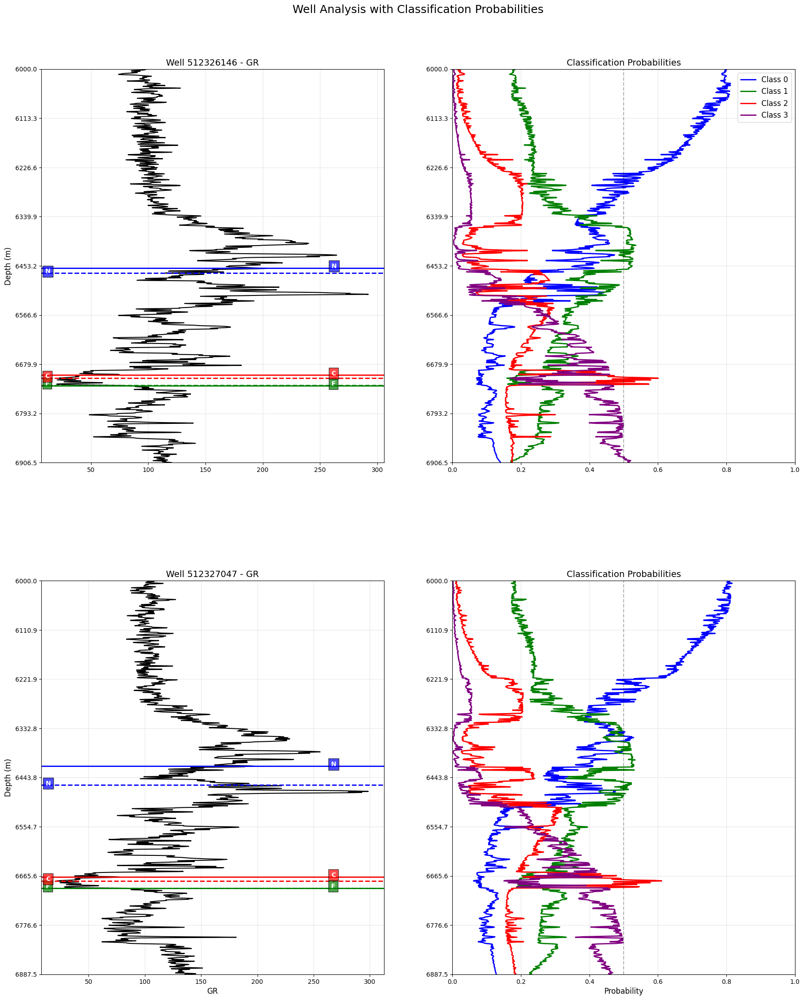

In [123]:
selected_wells = well_list[:20]

fig = display_enhanced_well_analysis(
    well_ids=selected_wells,
    df_log=df_log_50,
    df_tops_real=df_tops_50,
    df_preds=df_preds,
    model=model,
    input_variable=['GR', 'Depth', 'Latitude', 'Longitude'],
    start_depth=6000,
    end_depth=7000,  # Set your desired end depth
    max_wells=2,
    figsize=(20, 24),
    device=device
)
fig.savefig('well_analysis.png',    # filename (you can include a full path)
            dpi=300,                # resolution in dots per inch
            bbox_inches='tight'     # trim extra whitespace
           )
plt.show()